
* **Selected Data**: After reading the CSV,selects specific columns ('Respondent', 'StackOverflowHasAccount', 'Hobby', ...) from the dataset.
* create a graph named G.
* **Node** : For each row in the selected data, it adds nodes to the graph if the '**StackOverflowHasAccount**' and **StackOverflowConsiderMember** attributes for a developer is marked as '**Yes**', assuming 'Respondent' as the unique identifier for the node.
* **Edges** : It iterates through nodes and establishes edges based on specific conditions:


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import community.community_louvain as community_louvain
from networkx.algorithms.community.centrality import girvan_newman
import time
from matplotlib.lines import Line2D
from networkx.algorithms.community import asyn_lpa_communities
from matplotlib.colors import ListedColormap

In [ ]:
data = pd.read_csv('survey_results_public.csv',error_bad_lines=False)
data.fillna({'Gender': 'Unknown', 'FormalEducation': 'Unknown', 'Age': 'Unknown','Student': 'Unknown', 'DevType': 'Unknown', 'IDE': 'Unknown'}, inplace=True)
data.head()

<ipython-input-29-0b29f878480d>:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  data = pd.read_csv('survey_results_public.csv',error_bad_lines=False)
<ipython-input-29-0b29f878480d>:1: DtypeWarning: Columns (8,12,13,14,15,16,50,51,52,53,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('survey_results_public.csv',error_bad_lines=False)


,Respondent,Hobby,OpenSource,Country,Student,Employment,FormalEducation,UndergradMajor,CompanySize,DevType,...,Exercise,Gender,SexualOrientation,EducationParents,RaceEthnicity,Age,Dependents,MilitaryUS,SurveyTooLong,SurveyEasy
0,1,Yes,No,Kenya,No,Employed part-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,20 to 99 employees,Full-stack developer,...,3 - 4 times per week,Male,Straight or heterosexual,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Black or of African descent,25 - 34 years old,Yes,NaN,The survey was an appropriate length,Very easy
1,3,Yes,Yes,United Kingdom,No,Employed full-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)","A natural science (ex. biology, chemistry, phy...","10,000 or more employees",Database administrator;DevOps specialist;Full-...,...,Daily or almost every day,Male,Straight or heterosexual,"Bachelor’s degree (BA, BS, B.Eng., etc.)",White or of European descent,35 - 44 years old,Yes,NaN,The survey was an appropriate length,Somewhat easy
2,4,Yes,Yes,United States,No,Employed full-time,Associate degree,"Computer science, computer engineering, or sof...",20 to 99 employees,Engineering manager;Full-stack developer,...,NaN,Unknown,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN
3,5,No,No,United States,No,Employed full-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)","Computer science, computer engineering, or sof...",100 to 499 employees,Full-stack developer,...,I don't typically exercise,Male,Straight or heterosexual,Some college/university study without earning ...,White or of European descent,35 - 44 years old,No,No,The survey was an appropriate length,Somewhat easy
4,7,Yes,No,South Africa,"Yes, part-time",Employed full-time,Some college/university study without earning ...,"Computer science, computer engineering, or sof...","10,000 or more employees",Data or business analyst;Desktop or enterprise...,...,3 - 4 times per week,Male,Straight or heterosexual,Some college/university study without earning ...,White or of European descent,18 - 24 years old,Yes,NaN,The survey was an appropriate length,Somewhat easy


In [ ]:
selected_columns = ['Respondent', 'StackOverflowHasAccount','StackOverflowConsiderMember', 'Age','Gender','Country','Student','OpenSource','Hobby','IDE','DevType','YearsCoding','Employment','FormalEducation']
selected_data = data[selected_columns].sample(3000,random_state=42)

G = nx.Graph()

def is_valid_attribute(value):
    return value != 'Unknown'

def add_node_if_valid(graph, row):
    if (
        row['StackOverflowHasAccount'] == 'Yes' and
        row['StackOverflowConsiderMember'] == 'Yes' and
        all(is_valid_attribute(row[attr]) for attr in ['Gender', 'Age', 'OpenSource','Student', 'Hobby', 'DevType', 'IDE','Country', 'YearsCoding', 'Employment', 'FormalEducation'])
    ):
        developer_id = row['Respondent']
        graph.add_node(
            developer_id,
            Gender=row['Gender'],
            age=row['Age'],
            OpenSource=row['OpenSource'],
            Hobby=row['Hobby'],
            DevType=row['DevType'],
            Country=row['Country'],
            IDE=row['IDE'],
            Student=row['Student'],
            YearsCoding=row['YearsCoding'],
            Employment=row['Employment'],
            FormalEducation=row['FormalEducation']
        )

for idx, row in selected_data.iterrows():
    add_node_if_valid(G, row)


In [ ]:
for node1 in G.nodes():
    for node2 in G.nodes():
        if node1 != node2:
            same_age_and_gender = (
                G.nodes[node1]['age'] == G.nodes[node2]['age'] and
                G.nodes[node1]['Gender'] == G.nodes[node2]['Gender'] and
                G.nodes[node1]['Hobby'] == G.nodes[node2]['Hobby'] and
                G.nodes[node1]['DevType'] == G.nodes[node2]['DevType']

            )
            same_interest = (
                G.nodes[node1]['IDE'] == G.nodes[node2]['IDE'] and
                G.nodes[node1]['OpenSource'] == G.nodes[node2]['OpenSource'] and
                G.nodes[node1]['YearsCoding'] == G.nodes[node2]['YearsCoding']
            )
            same_employment_and_education = (
                G.nodes[node1]['Employment'] == G.nodes[node2]['Employment'] and
                G.nodes[node1]['FormalEducation'] == G.nodes[node2]['FormalEducation']
            )

            if same_interest or same_age_and_gender or same_employment_and_education :
                G.add_edge(node1, node2)


In [ ]:
node_attributes = {node: attr for node, attr in G.nodes(data=True)}
df = pd.DataFrame.from_dict(node_attributes, orient='index')#Converts the node_attributes dictionary into a Pandas DataFrame
display(df)

,Gender,age,OpenSource,Hobby,DevType,Country,IDE,Student,YearsCoding,Employment,FormalEducation
5004,Male,45 - 54 years old,No,No,Front-end developer,United Kingdom,Notepad++;Visual Studio,No,21-23 years,"Independent contractor, freelancer, or self-em...",Some college/university study without earning ...
3984,Male,25 - 34 years old,Yes,No,Back-end developer;Front-end developer,United States,Emacs;IntelliJ;IPython / Jupyter;PyCharm;Vim;V...,No,12-14 years,Employed full-time,"Master’s degree (MA, MS, M.Eng., MBA, etc.)"
36112,Male,25 - 34 years old,Yes,Yes,Mobile developer,United States,IntelliJ;IPython / Jupyter;PyCharm;Sublime Tex...,"Yes, full-time",6-8 years,Employed full-time,"Master’s degree (MA, MS, M.Eng., MBA, etc.)"
48744,Male,35 - 44 years old,Yes,Yes,Back-end developer;Desktop or enterprise appli...,Brazil,Sublime Text,"Yes, part-time",6-8 years,"Independent contractor, freelancer, or self-em...",Some college/university study without earning ...
11578,Male,18 - 24 years old,No,Yes,Full-stack developer,"Iran, Islamic Republic of...",Atom;Visual Studio;Visual Studio Code;Xcode,"Yes, part-time",3-5 years,Employed full-time,"Master’s degree (MA, MS, M.Eng., MBA, etc.)"
...,...,...,...,...,...,...,...,...,...,...,...
5255,Male,25 - 34 years old,Yes,Yes,Back-end developer;Designer;Desktop or enterpr...,India,Atom;Eclipse;Notepad++;Sublime Text,No,3-5 years,Employed full-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)"
68326,Male,35 - 44 years old,No,No,Back-end developer;Desktop or enterprise appli...,Australia,Eclipse;NetBeans;Notepad++,"Yes, full-time",12-14 years,Employed full-time,"Bachelor’s degree (BA, BS, B.Eng., etc.)"
50222,Male,25 - 34 years old,No,Yes,Back-end developer;Front-end developer;Full-st...,United Kingdom,Atom;PHPStorm;Sublime Text;Visual Studio,No,12-14 years,Employed full-time,Some college/university study without earning ...
28995,Male,25 - 34 years old,No,Yes,Back-end developer;Full-stack developer,United States,IntelliJ;Notepad++;Sublime Text;Visual Studio,No,18-20 years,Employed full-time,"Master’s degree (MA, MS, M.Eng., MBA, etc.)"


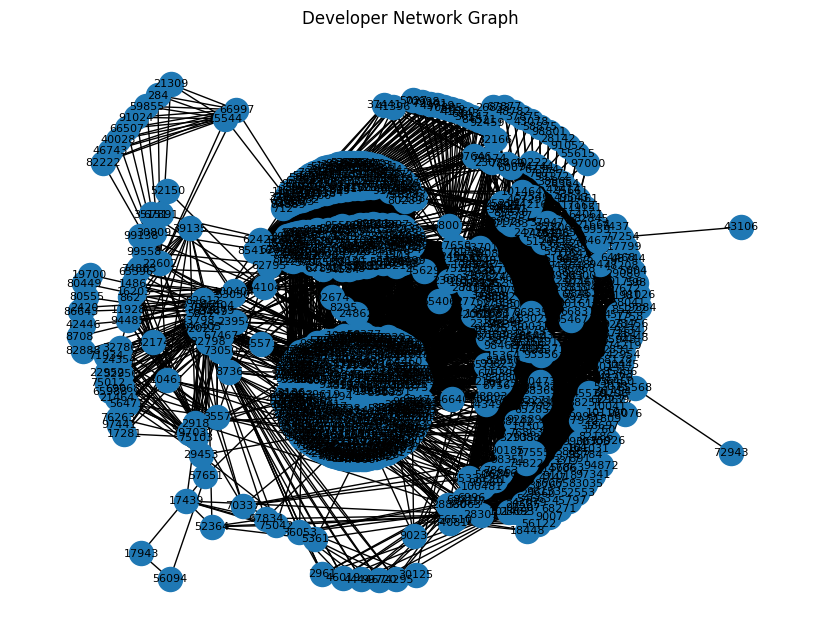

In [ ]:
plt.figure(figsize=(8, 6))
pos = nx.kamada_kawai_layout(G)
nx.draw(G, pos, with_labels=True, node_size=300, font_size=8)
plt.title("Developer Network Graph")
plt.show()

<ipython-input-35-86ef5d909534>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20b', len(unique_countries)) #This is like choosing a special set of colors for each country


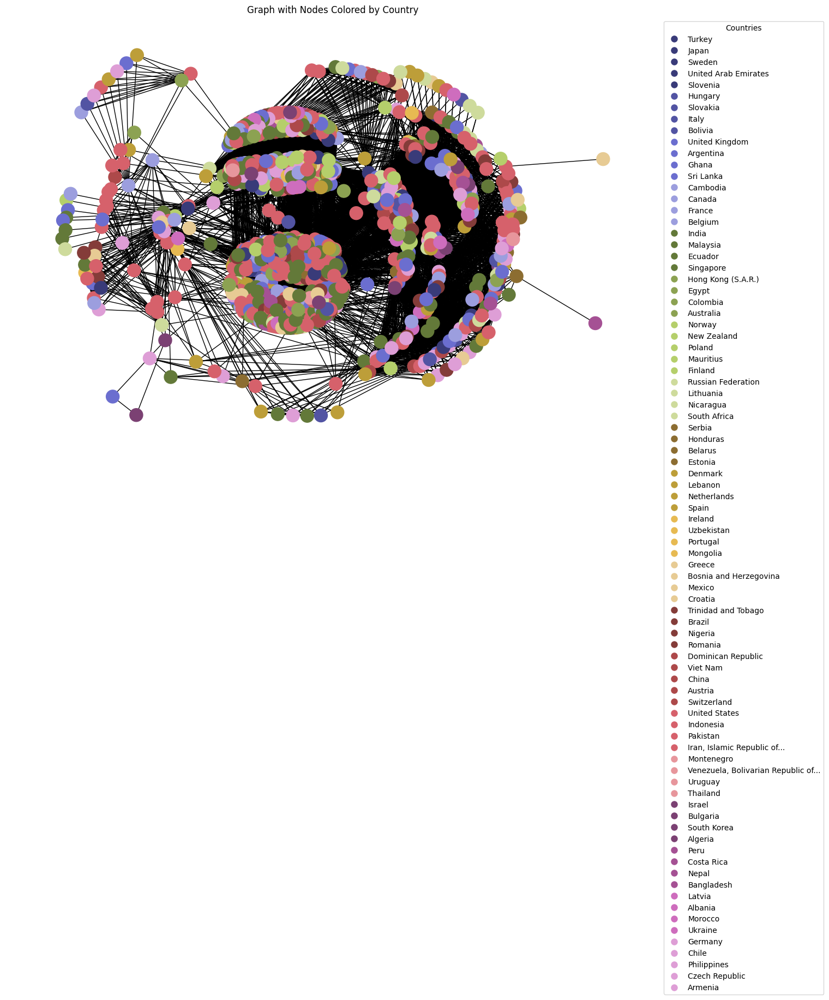

In [ ]:
pos = nx.kamada_kawai_layout(G)

unique_countries = list(set(nx.get_node_attributes(G, 'Country').values())) #First, we find out how many different countries we have
cmap = plt.cm.get_cmap('tab20b', len(unique_countries)) #This is like choosing a special set of colors for each country

#Now we decide which color each country will have
node_colors = [cmap(i) for i in range(len(unique_countries))]

# Map countries to their respective colors
country_color_map = dict(zip(unique_countries, node_colors))

#here it's like making a list that says which color belongs to which country
node_colors = [country_color_map[G.nodes[node]['Country']] for node in G.nodes]

# Draw the graph with nodes colored by country
plt.figure(figsize=(12, 8))
nx.draw(G, pos, node_color=node_colors, with_labels=False)

legend_handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=country_color_map[country], markersize=10, label=country)
                  for country in unique_countries]

plt.legend(handles=legend_handles, title="Countries", bbox_to_anchor=(1, 1), loc='upper left')

plt.title("Graph with Nodes Colored by Country")
plt.show()


<ipython-input-36-f87b6acfcc75>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map_for_students = plt.cm.get_cmap('Set1', len(unique_student_types))


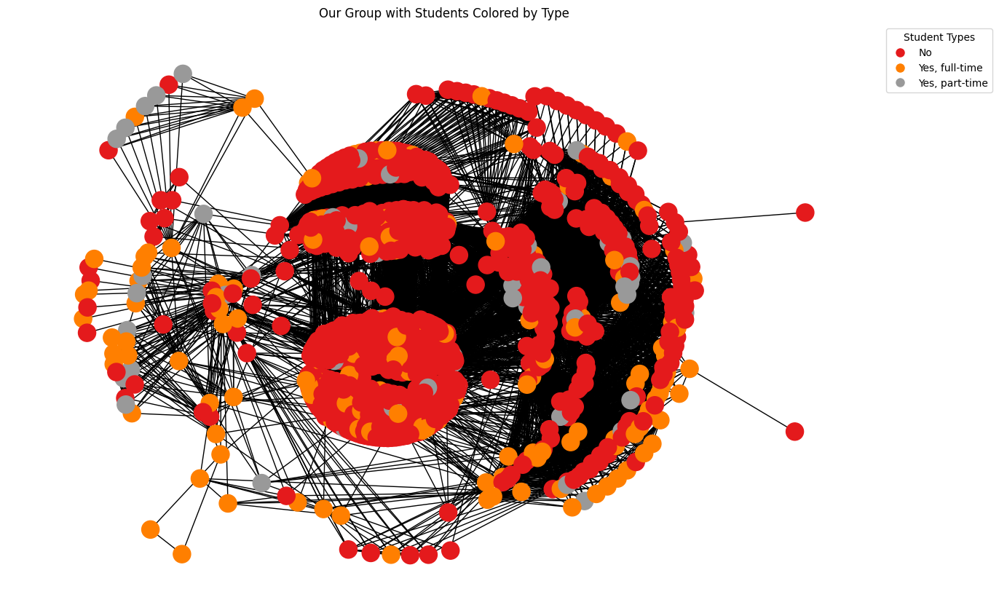

In [ ]:
# Get a list of different student types
unique_student_types = list(set(nx.get_node_attributes(G, 'Student').values()))

# Pick colors for each student type
color_map_for_students = plt.cm.get_cmap('Set1', len(unique_student_types))

position_of_students = nx.kamada_kawai_layout(G)

#Here, we assign each color to every student based on their type
colors_for_students = [unique_student_types.index(G.nodes[node]['Student']) for node in G.nodes]

plt.figure(figsize=(12, 8))
nx.draw(G, position_of_students, node_color=colors_for_students, cmap=color_map_for_students, with_labels=False)

# Create a guide that says which color is for which student type
legend_handles_for_students = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map_for_students(i), markersize=10, label=student_type)
                               for i, student_type in enumerate(unique_student_types)]

plt.legend(handles=legend_handles_for_students, title="Student Types", bbox_to_anchor=(1, 1), loc='upper left')

plt.title("Our Group with Students Colored by Type")
plt.show()


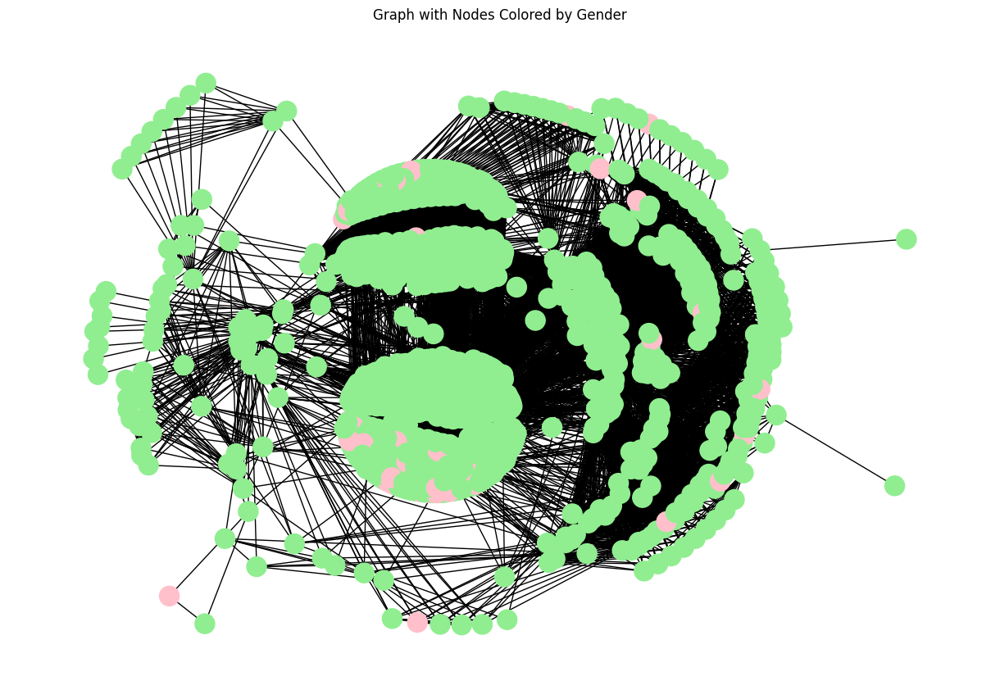

In [ ]:
# Create a colormap for the 'Gender' attribute
cmap = ListedColormap(['lightgreen', 'pink'])

plt.figure(figsize=(12, 8))
pos = nx.kamada_kawai_layout(G)

# assign colors based on 'Gender' attribute , Male-->lightgreen and female-->pink
node_colors = [0 if G.nodes[node]['Gender'] == 'Male' else 1 for node in G.nodes]

nx.draw(G, pos, node_color=node_colors, cmap=cmap, with_labels=False)
plt.title("Graph with Nodes Colored by Gender")
plt.show()


# Community Detection Algorithms


Label Propagation Algorithm

Number of communities detected by Label Propagation Algorithm: 32
Modularity of Label Propagation Algorithm: 0.4234080504544504
Label Propagation Algorithm - Execution time: 0.1352 seconds
Community 1: {43106, 78469, 77254, 17799, 48744, 5004, 7437, 71276, 77772, 19884, 91026, 598, 6007, 59288}


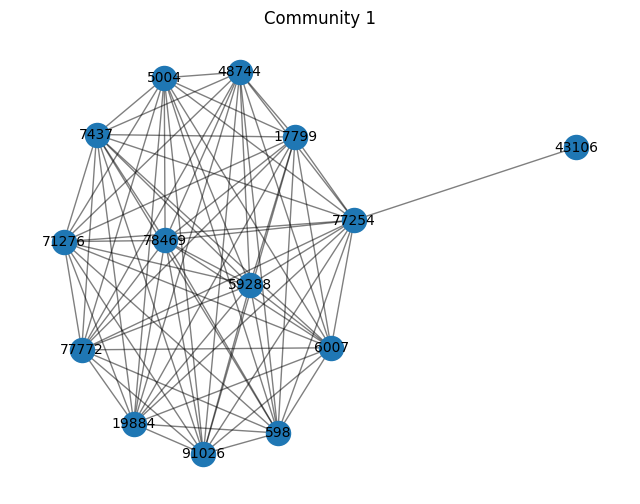

Community 2: {74247, 81419, 3597, 87057, 91154, 76819, 64019, 11286, 44054, 12314, 52763, 45083, 83485, 59424, 28709, 54310, 75823, 65587, 3123, 91190, 64056, 16441, 67133, 93757, 11837, 11840, 92224, 54339, 88643, 70213, 72268, 59980, 42060, 67152, 71262, 34917, 41578, 51821, 41586, 68216, 9339, 3195, 26747, 23166, 19583, 93819, 80001, 80512, 32900, 73353, 63626, 26251, 40082, 46740, 59028, 32916, 33947, 94876, 27297, 7329, 7338, 25258, 87727, 80560, 59573, 30904, 75963, 17595, 16583, 712, 58571, 32460, 35533, 38606, 82636, 15058, 65748, 60630, 70870, 9431, 1244, 78560, 62177, 89314, 93409, 43234, 231, 47337, 47852, 34541, 7406, 50417, 21747, 57075, 9974, 76535, 41722, 75515, 76540, 73981, 74494, 73470, 67840, 37121, 64765, 74499, 60167, 20235, 15116, 30475, 65295, 36112, 82197, 58648, 95520, 65826, 26406, 20266, 814, 23343, 83758, 44339, 65332, 19766, 11578, 24890, 28995, 96589, 58704, 77137, 53075, 40788, 19286, 35674, 26970, 38751, 78176, 68964, 28523, 100207, 97650, 40307, 7026, 2

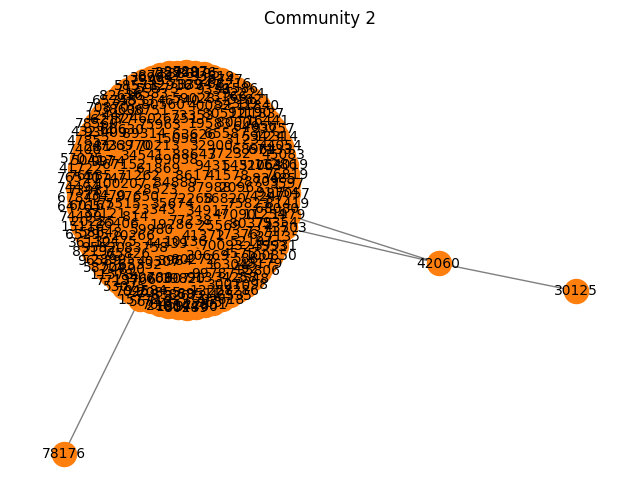

Community 3: {45570, 15364, 82950, 48776, 18697, 82186, 37260, 919, 281, 32935, 95784, 101031, 55338, 98351, 10041, 18749, 91454, 50624, 70337, 101190, 78663, 74822, 12239, 50141, 51809, 30306, 38257, 77555}


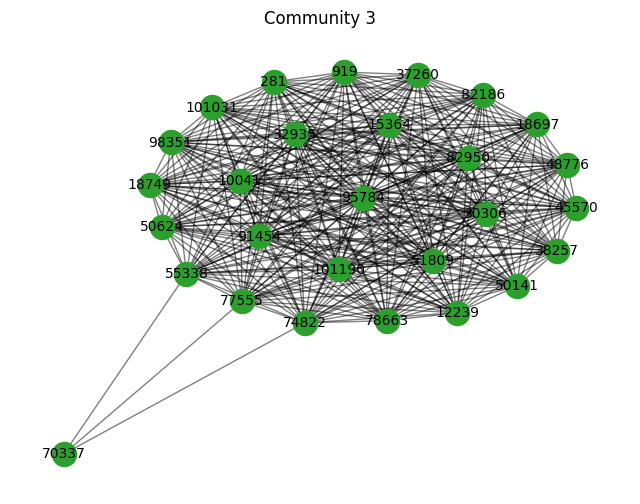

Community 4: {2051, 34827, 28698, 26651, 36892, 55326, 24630, 43064, 38969, 14394, 36931, 71753, 69710, 92242, 34899, 73816, 45144, 75871, 79971, 16486, 100455, 45160, 8300, 47214, 8311, 28793, 57469, 49289, 65687, 41113, 75942, 94382, 94384, 45240, 69842, 22740, 37079, 4316, 37089, 57570, 39139, 67815, 86248, 6390, 6392, 16634, 61695, 63743, 28931, 39176, 65809, 37150, 22821, 49459, 74035, 49464, 55621, 41287, 63817, 340, 51543, 82263, 90455, 86372, 65899, 41327, 33136, 90481, 70005, 39292, 84348, 53631, 47494, 98700, 402, 39314, 18852, 37284, 70058, 35251, 100793, 82364, 31169, 12744, 84432, 100830, 94686, 55774, 96740, 45544, 29165, 68086, 18941, 49667, 64003, 49671, 78356, 25109, 53783, 98840, 100887, 82457, 27165, 68129, 41511, 94760, 47660, 2608, 47666, 23091, 98869, 68158, 29252, 96841, 96853, 84566, 92762, 72286, 8803, 80489, 84587, 94830, 45684, 64122, 70277, 62094, 78483, 8853, 47770, 64159, 31393, 60067, 72360, 33453, 27314, 49846, 39619, 94915, 17094, 29389, 62161, 41693, 6

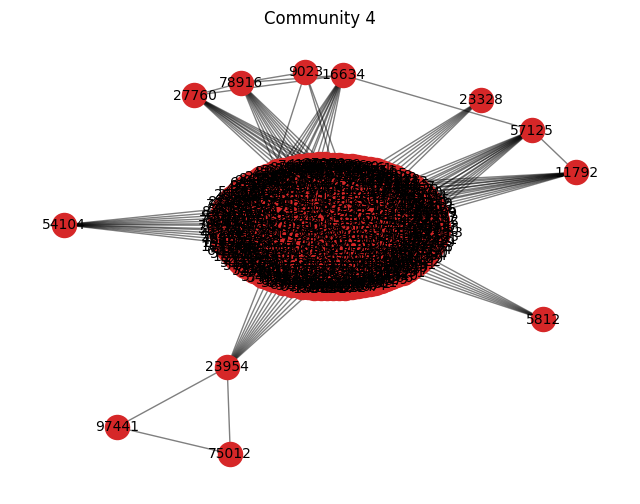

Community 5: {65568, 8736, 46019, 68710, 99720, 20585, 46729, 96076, 72943, 2961, 36053, 74295, 73050, 28860, 44446}


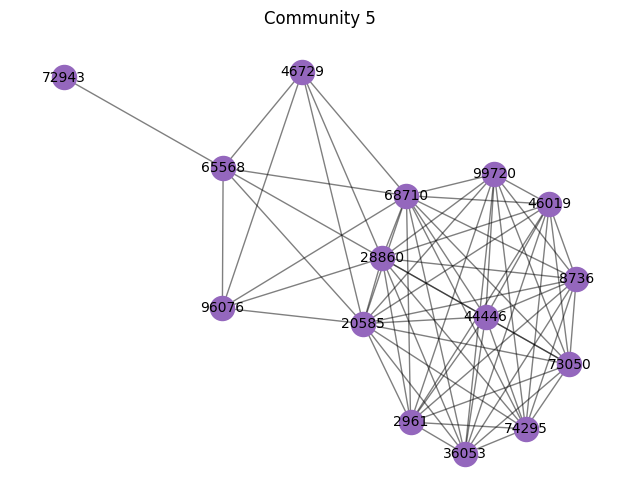

Community 6: {96768, 6528, 66817, 75267, 61444, 62080, 99592, 54539, 28814, 34679, 32017, 65426, 66837, 95638, 22806, 22044, 98462, 27935, 800, 21407, 85670, 78504, 94764, 50222, 90161, 84019, 46387, 24634, 59706, 37947, 22589, 10174, 97466, 13630, 46401, 36216, 71367, 83275, 28495, 99279, 64465, 8532, 33877, 29271, 33112, 79705, 74075, 95452, 69983, 59362, 6628, 13797, 100326, 95079, 63078, 71783, 17642, 99179, 95467, 9066, 18544, 17906, 50035, 96500, 21621, 39926, 28535, 53624, 40441, 63738, 71026, 25214}


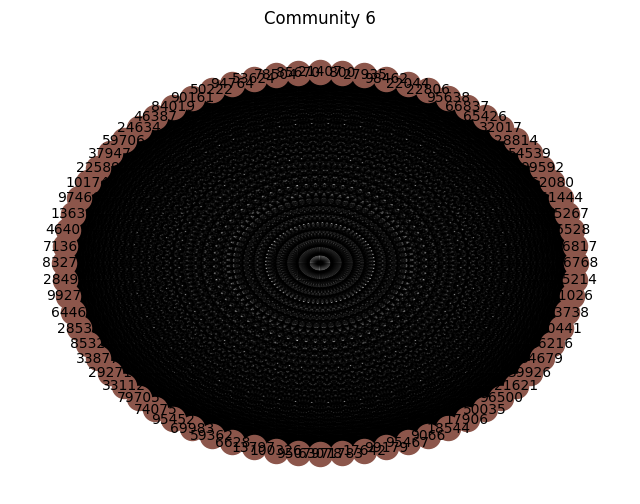

Community 7: {16291, 67877, 43078, 97000, 93356, 91052, 28142, 48782, 98801, 26833, 37875, 58875, 55615}


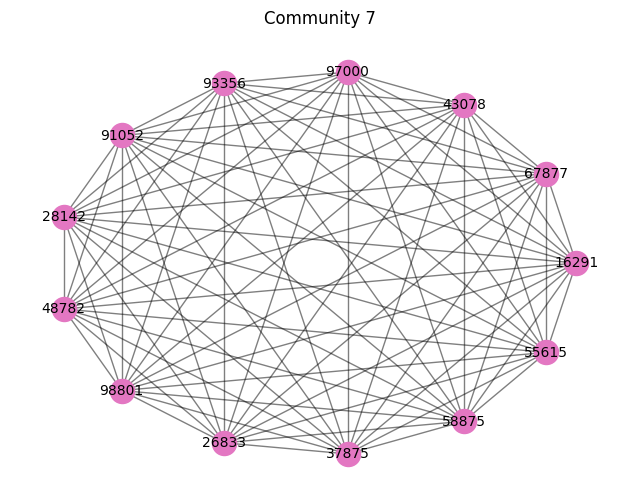

Community 8: {100481, 54663, 91018, 4747, 14349, 11025, 31767, 96153, 101402, 99995, 56863, 55712, 164, 33063, 86065, 58685, 28093, 39617, 91207, 90185, 23371, 67539, 6996, 29660, 42079, 77922, 70125, 99569, 14706, 27891, 2164, 3317, 60407, 99067, 48893}


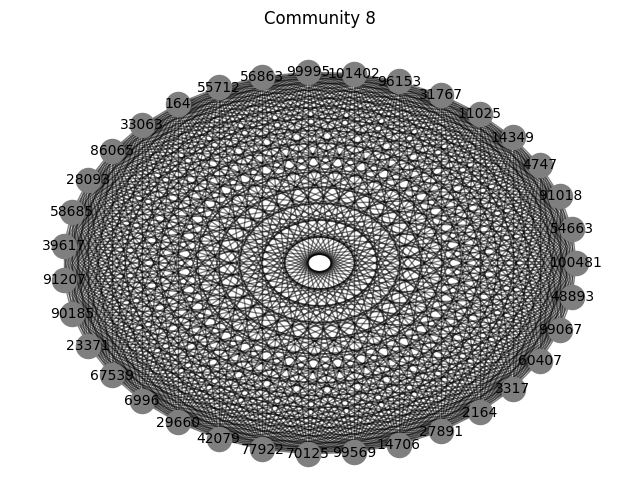

Community 9: {17281, 65988, 76263, 22952, 67467, 43798, 21464, 92027, 71934, 75103}


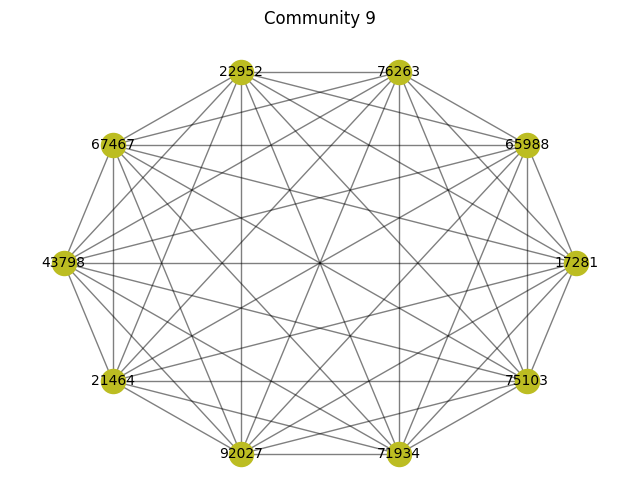

Community 10: {45571, 45797, 83080, 52553, 9007, 18448, 99825, 68271, 84081, 8756, 86866, 55926, 94872, 56122, 83035, 97341, 56510}


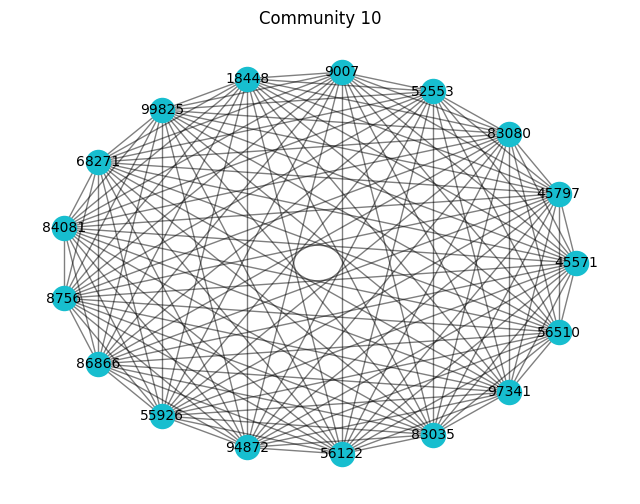

Community 11: {65285, 94342, 16146, 29080, 24216, 802, 28456, 52271, 58041, 1981, 52546, 94532, 78148, 1480, 34890, 48208, 64468, 101464, 1758, 38369, 85222, 10473, 91756, 7672}


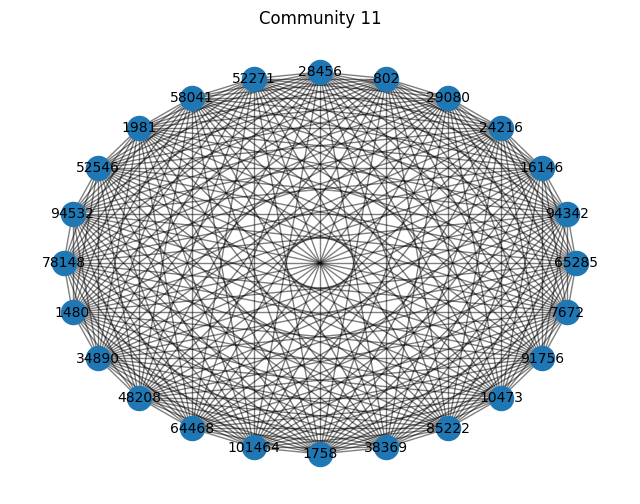

Community 12: {7319, 5027, 32166, 68007, 85416, 84521, 92459, 36147, 41396, 49719, 37441, 62795, 70998, 41560, 62424, 70885, 67181, 97646, 17650, 79101, 6143}


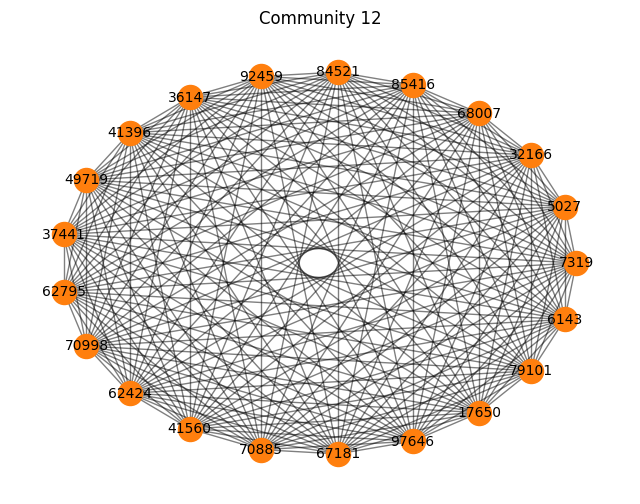

Community 13: {65406, 8295}


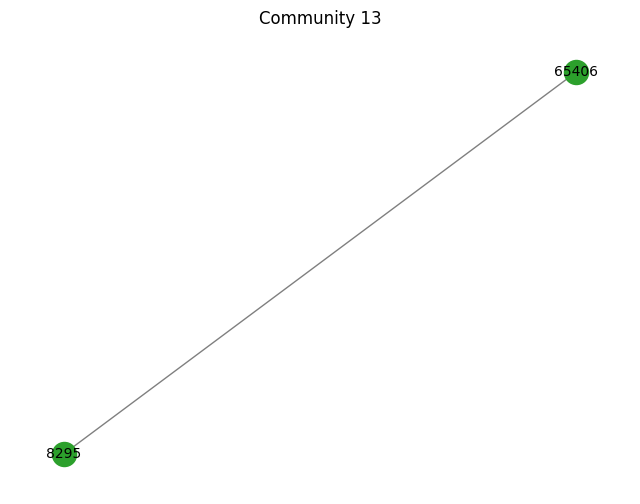

Community 14: {15232, 33025, 89477, 49543, 17162, 78219, 24977, 94744, 82845, 40222, 64671, 21664, 59172, 23078, 81959, 95661, 42414, 10031, 86835, 64061, 53701, 79174, 28364, 19151, 9808, 84433, 38865, 43491, 9959, 100461, 79737, 63354}


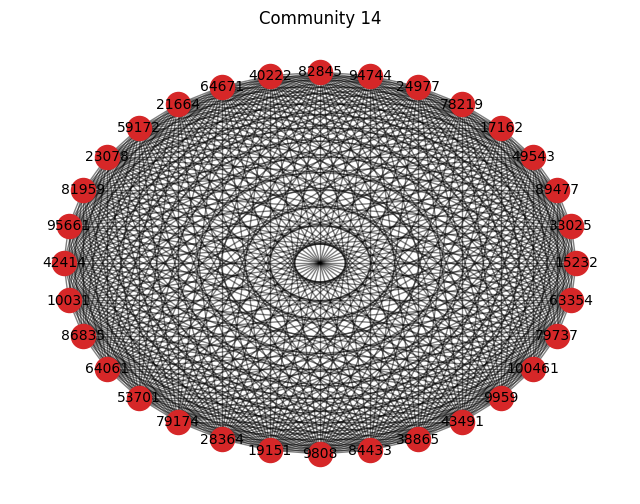

Community 15: {22602, 66507, 82222, 40028, 91024, 59855, 66997, 46743, 15544, 284, 21309}


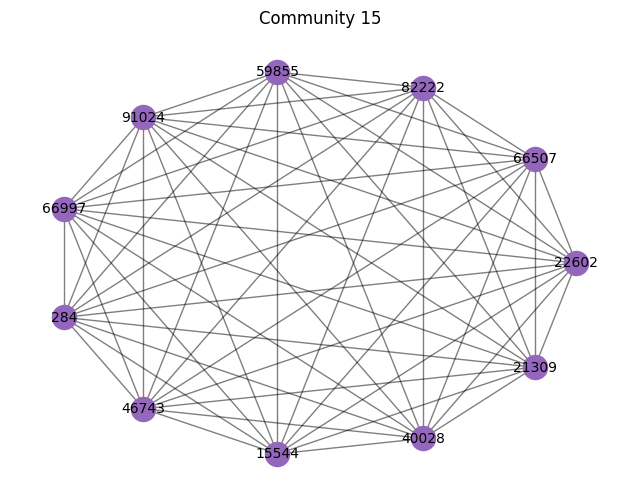

Community 16: {24354, 66404, 3557, 46405, 32679, 69068, 29453, 32786, 79703, 56471, 52956}


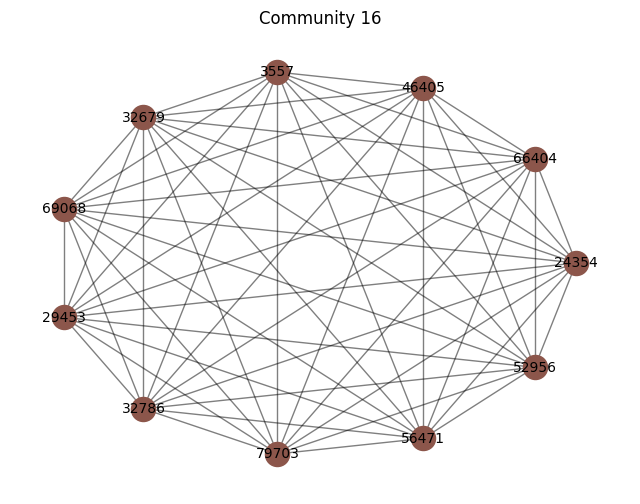

Community 17: {2831, 24726, 68128, 18082, 98468, 58797, 69296, 101303, 85943, 85436, 94525, 76863, 51267, 92617, 42954, 48345, 92889, 4573, 21088, 36450, 19302, 52073, 74219, 30445, 24558, 87281, 62967, 38142, 67839}


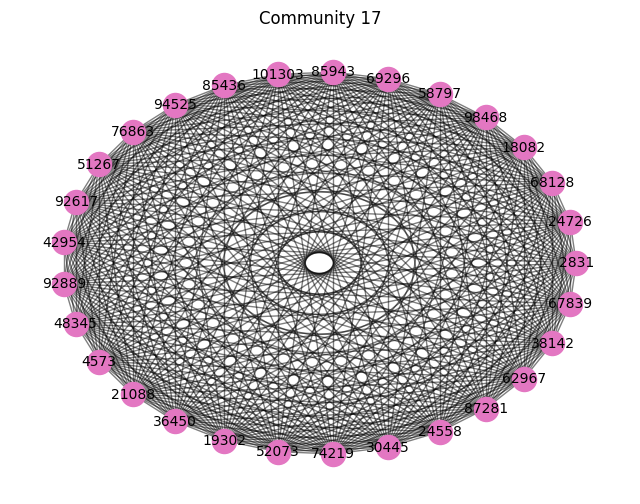

Community 18: {74883, 23013, 99558, 16203, 67891, 30809}


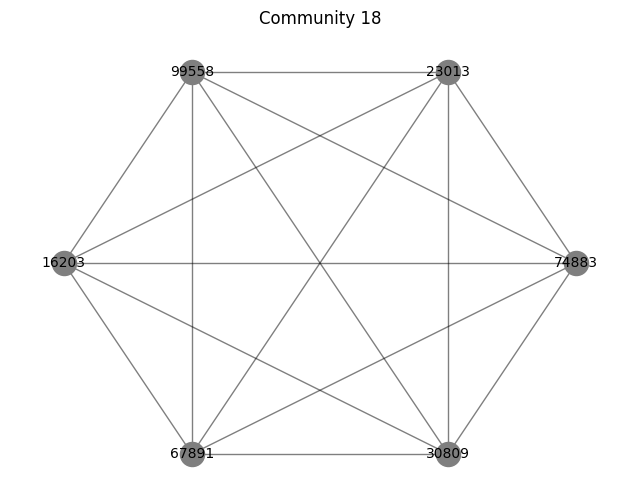

Community 19: {92674, 45629}


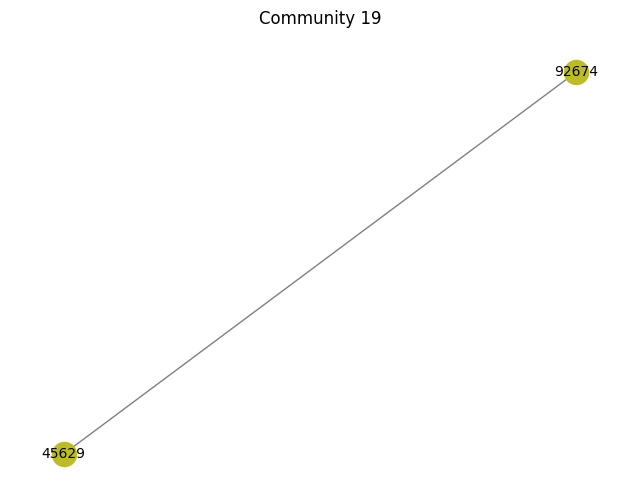

Community 20: {23059, 80449, 86643, 8708}


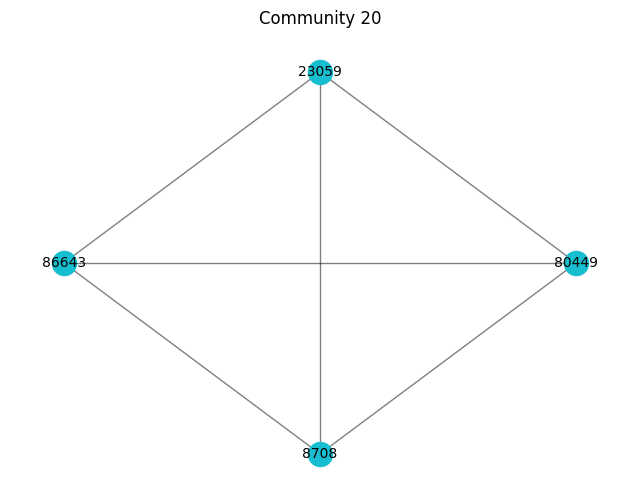

Community 21: {68449, 2918, 53030, 32174, 1486, 65396, 100404, 94485, 11928, 10461, 862, 39135}


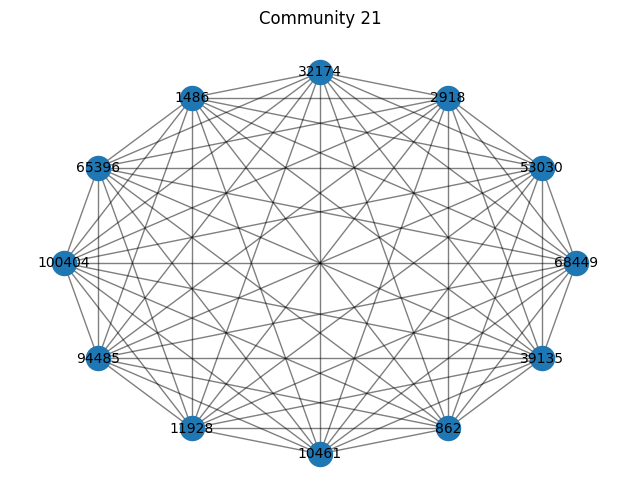

Community 22: {27147}


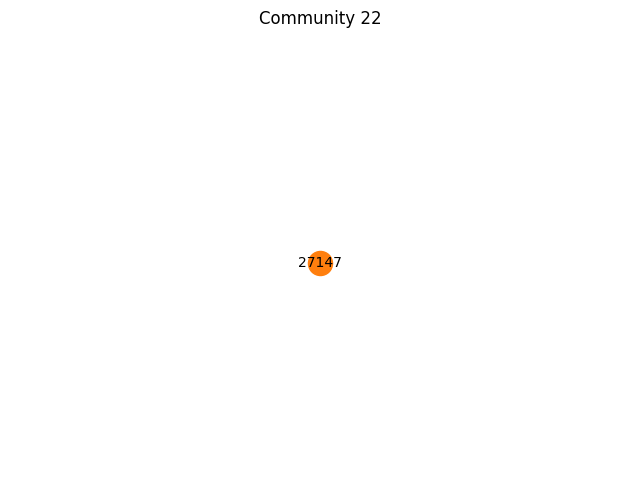

Community 23: {75042, 52364, 22798, 5361, 28307, 67834, 17439}


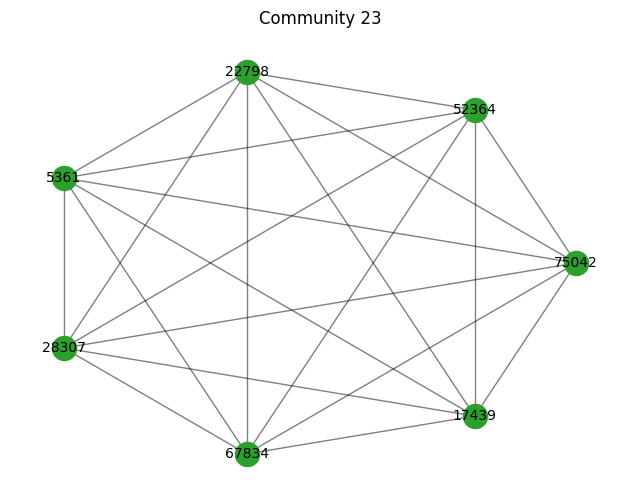

Community 24: {42478}


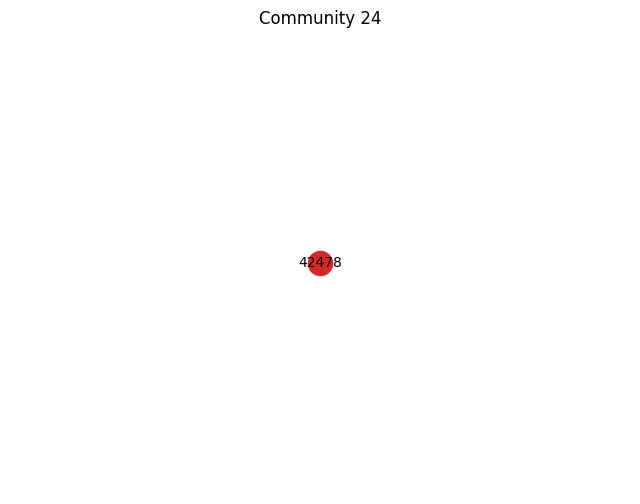

Community 25: {99138, 52150, 35151}


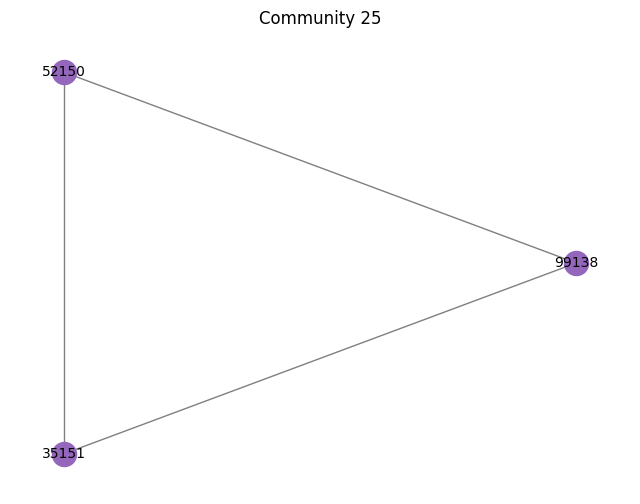

Community 26: {57651, 56094, 17943}


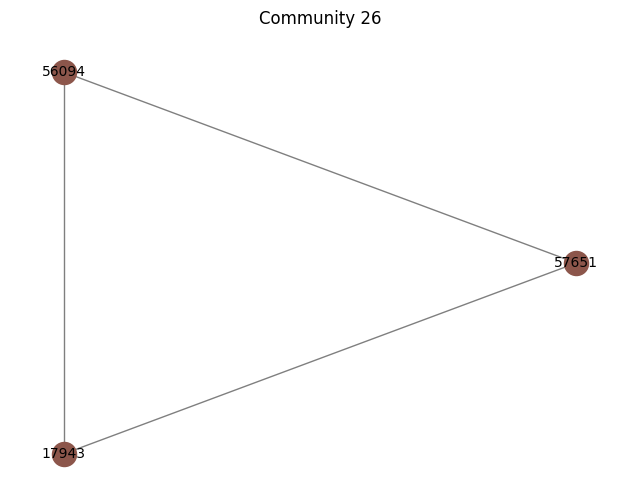

Community 27: {62179}


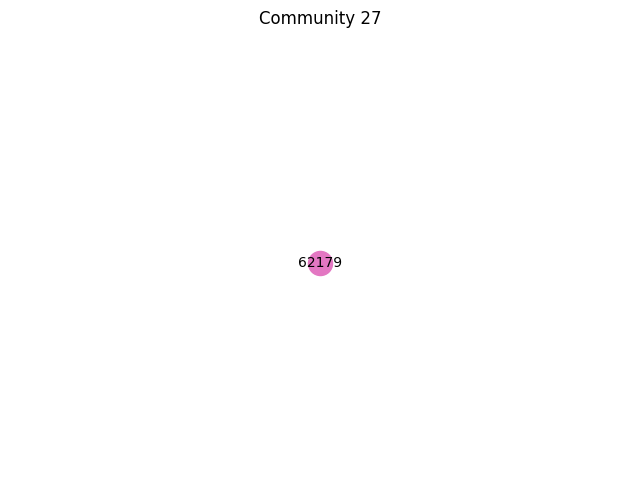

Community 28: {2420, 82612, 19700}


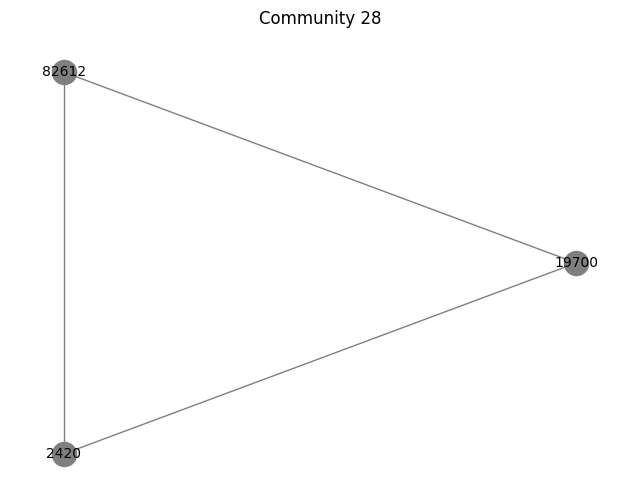

Community 29: {25924, 84484, 36145, 90648, 24862}


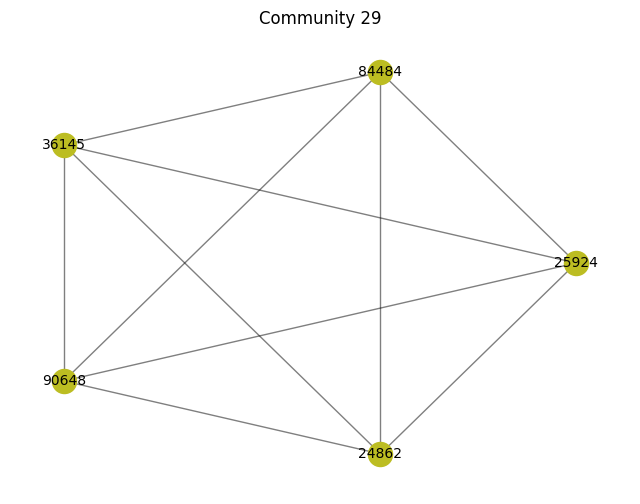

Community 30: {82888, 80555, 42446}


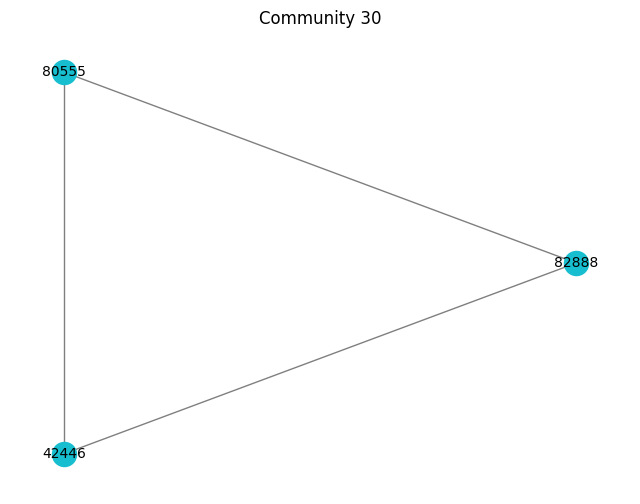

Community 31: {28903}


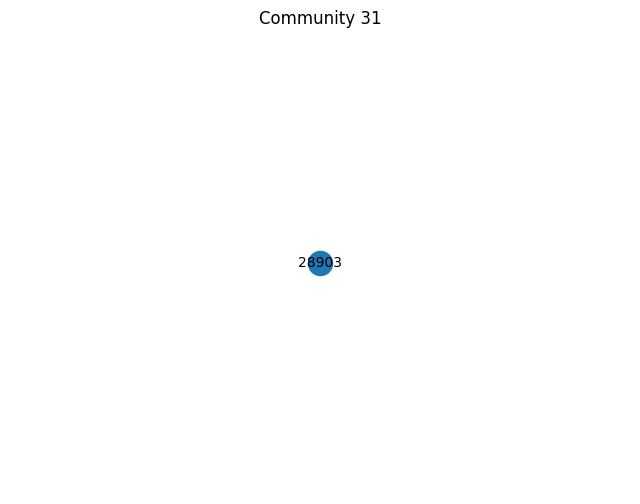

Community 32: {46640}


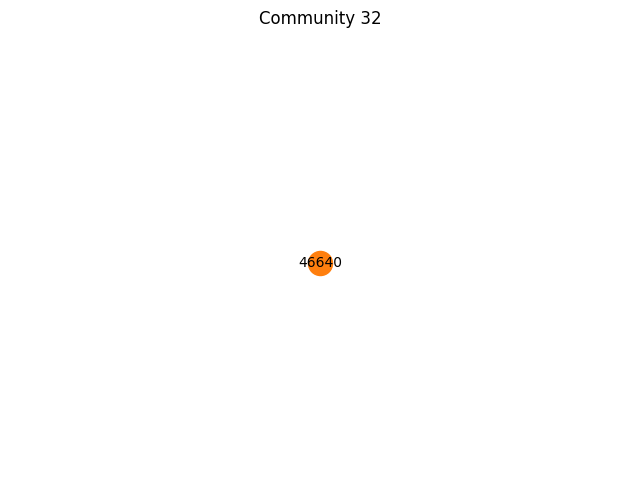

In [ ]:
start_time_lpa = time.time()

# here we first Apply Label Propagation Algorithm
communities_lpa = list(asyn_lpa_communities(G))
num_communities_lpa = len(communities_lpa)
print("Number of communities detected by Label Propagation Algorithm:", num_communities_lpa)

end_time_lpa = time.time()

# calculate modularity
modularity_lpa = nx.community.quality.modularity(G, communities_lpa)
print("Modularity of Label Propagation Algorithm:", modularity_lpa)

# execution time
lpa_time = end_time_lpa - start_time_lpa
print(f"Label Propagation Algorithm - Execution time: {lpa_time:.4f} seconds")

# Visualization / printing
for idx, community in enumerate(communities_lpa):
    print(f"Community {idx + 1}: {community}")

    plt.figure(figsize=(8, 6))
    pos = nx.kamada_kawai_layout(G.subgraph(community))

    nx.draw_networkx_nodes(G.subgraph(community), pos, node_color=f'C{idx}', node_size=300)
    nx.draw_networkx_labels(G.subgraph(community), pos, font_size=10)
    nx.draw_networkx_edges(G.subgraph(community), pos, alpha=0.5) #we put 0.5 so the edges will be semi-transparent

    plt.title(f'Community {idx + 1}')
    plt.axis('off')
    plt.show()


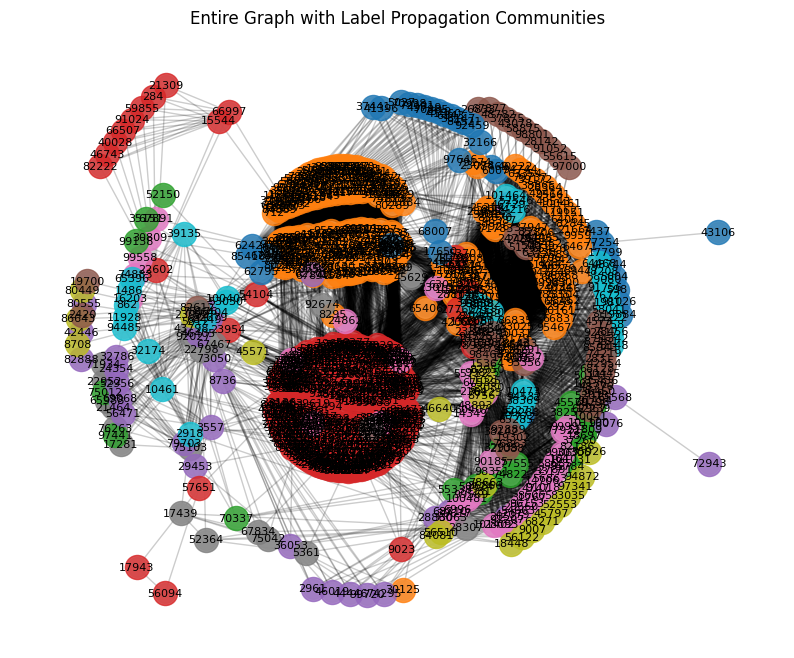

In [ ]:
# Visualization of the entire graph
plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(G)

# Draw nodes and edges for the entire graph with default color 'lightgray'
nx.draw_networkx_nodes(G, pos, node_color='lightgray', node_size=200, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.2)
nx.draw_networkx_labels(G, pos, font_size=8)

# Label Propagation community detection
label_propagation_communities = list(nx.algorithms.community.label_propagation_communities(G))

# Draw nodes for each Label Propagation community with distinct colors
for idx, community in enumerate(label_propagation_communities):
    nx.draw_networkx_nodes(G, pos, nodelist=list(community), node_color=f'C{idx}', node_size=300, alpha=0.8)

plt.title("Entire Graph with Label Propagation Communities")
plt.axis('off')
plt.show()





```
# Louvain Community Detection
```





Number of communities detected by Louvain Method: 12
Modularity of Louvain Communities: 0.41059045219676665
Louvain algorithm - Execution time: 11.7450 seconds
Community 1: frozenset({2051, 37894, 34827, 37911, 7193, 28698, 26651, 36892, 54301, 55326, 97315, 64549, 11303, 7217, 3122, 72755, 24630, 43064, 56377, 38969, 14394, 36931, 71753, 69710, 92242, 34899, 73816, 45144, 70750, 75871, 79971, 44134, 11366, 16486, 45160, 19561, 100455, 8300, 62572, 47214, 1137, 99445, 38006, 8311, 28793, 57469, 48255, 1156, 15495, 5255, 49289, 54410, 52368, 65687, 85145, 50330, 75942, 94382, 94384, 45240, 54460, 87228, 29887, 36045, 29906, 58579, 22740, 69842, 95446, 37079, 25815, 89305, 5339, 4316, 37089, 57570, 99553, 39139, 67815, 86248, 46313, 91369, 79082, 52458, 44269, 19697, 21745, 6390, 6392, 63743, 61695, 28931, 56582, 39176, 17673, 56589, 15633, 23826, 65809, 70935, 48409, 37150, 93473, 22821, 40234, 9521, 58673, 74035, 49459, 97587, 49464, 1338, 55621, 41287, 63817, 73034, 46415, 340, 90455,

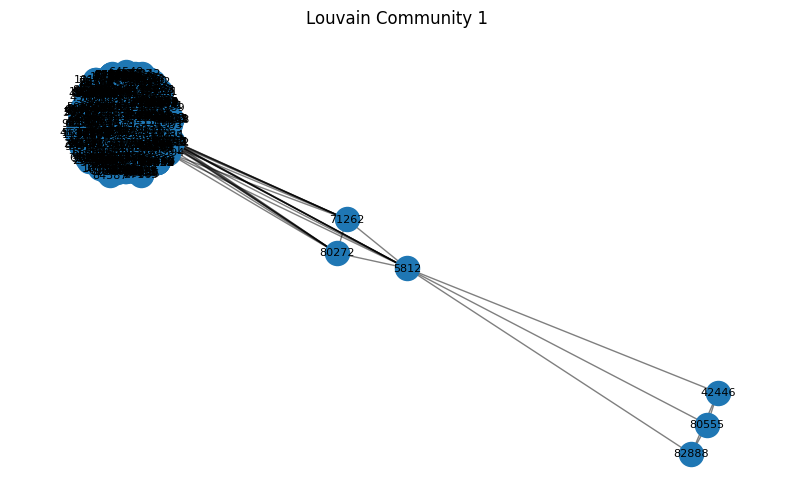

Community 2: frozenset({61444, 15364, 82950, 14349, 18448, 32786, 31767, 101402, 17439, 65568, 81959, 55338, 50222, 52271, 98351, 86065, 90161, 84019, 100404, 24634, 37947, 97341, 22589, 76863, 51267, 78916, 43078, 74822, 91207, 90185, 34890, 22602, 42060, 48208, 33877, 101464, 30809, 83035, 40028, 42079, 77922, 43106, 68710, 71783, 20585, 27760, 84081, 18544, 2164, 21621, 100481, 74883, 94342, 83080, 52364, 28814, 24726, 7319, 56471, 41113, 98462, 97441, 164, 98468, 32935, 93356, 15544, 97466, 28860, 56510, 26833, 36053, 48345, 95452, 10461, 39135, 70885, 99558, 85222, 10473, 17642, 95467, 72943, 5361, 99569, 87281, 27891, 17650, 3317, 96500, 67834, 16634, 63738, 79101, 71934, 38142, 67839, 66817, 75012, 99592, 18697, 82186, 54539, 7437, 22798, 32017, 66837, 94485, 22806, 281, 284, 27935, 75042, 67877, 33063, 92459, 82222, 36147, 67891, 46387, 57651, 59706, 58685, 94525, 55615, 18749, 13630, 91454, 46401, 52546, 78148, 94532, 46405, 52553, 62795, 83275, 35151, 8532, 70998, 33112, 7305

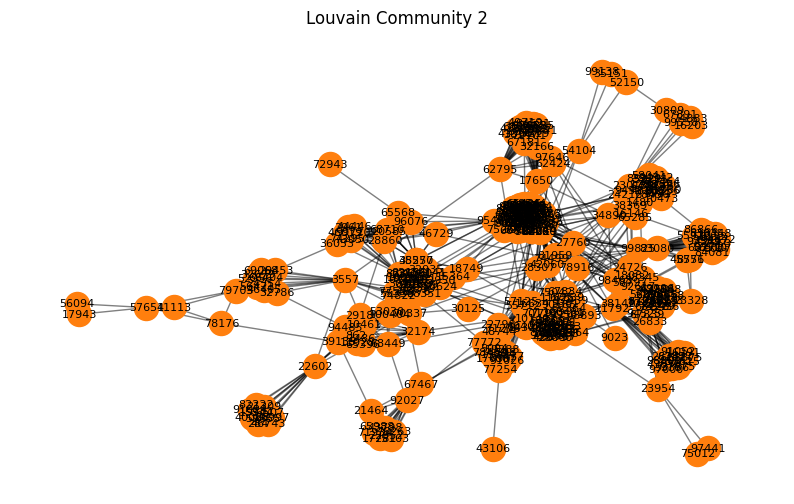

Community 3: frozenset({8708, 74247, 81419, 3597, 87057, 91154, 23059, 64019, 76819, 44054, 11286, 12314, 45083, 52763, 83485, 59424, 28709, 54310, 75823, 65587, 3123, 91190, 64056, 16441, 11837, 67133, 93757, 11840, 80449, 92224, 54339, 88643, 70213, 72268, 59980, 67152, 34917, 41578, 51821, 41586, 86643, 68216, 93819, 26747, 9339, 3195, 23166, 80512, 80001, 19583, 32900, 73353, 63626, 26251, 40082, 32916, 46740, 59028, 33947, 94876, 27297, 7329, 7338, 25258, 87727, 80560, 82612, 59573, 30904, 17595, 75963, 16583, 712, 58571, 82636, 35533, 32460, 38606, 15058, 65748, 70870, 60630, 9431, 1244, 78560, 93409, 62177, 89314, 43234, 231, 47337, 47852, 34541, 7406, 50417, 57075, 19700, 21747, 9974, 76535, 41722, 75515, 76540, 73981, 74494, 64765, 73470, 67840, 37121, 60167, 30475, 20235, 15116, 65295, 36112, 82197, 58648, 95520, 65826, 26406, 20266, 83758, 23343, 814, 44339, 65332, 19766, 24890, 11578, 28995, 96589, 58704, 77137, 53075, 40788, 19286, 26970, 35674, 38751, 68964, 28523, 100207

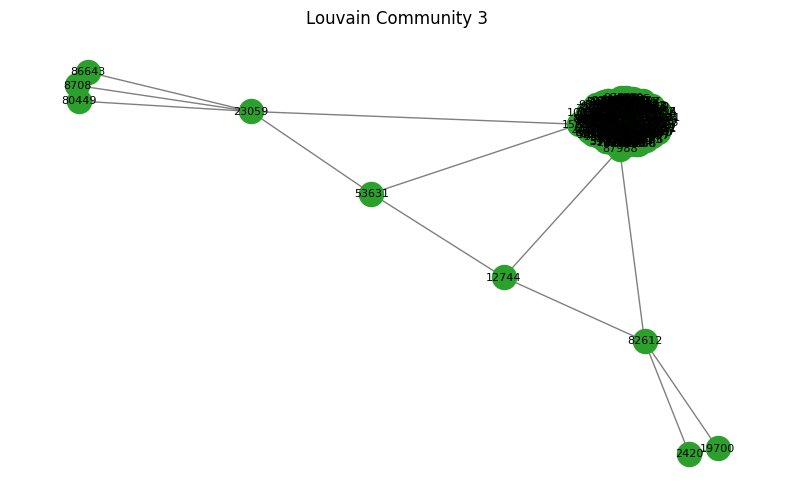

Community 4: frozenset({15232, 33025, 53701, 79174, 89477, 49543, 17162, 78219, 28364, 19151, 9808, 24977, 84433, 38865, 94744, 82845, 40222, 64671, 21664, 43491, 59172, 23078, 9959, 95661, 42414, 10031, 100461, 86835, 79737, 63354, 64061})


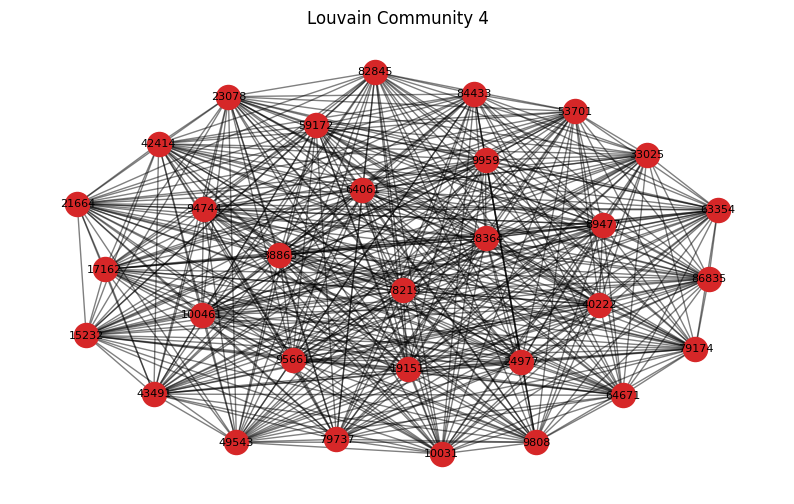

Community 5: frozenset({36145, 25924, 84484, 90648, 24862})


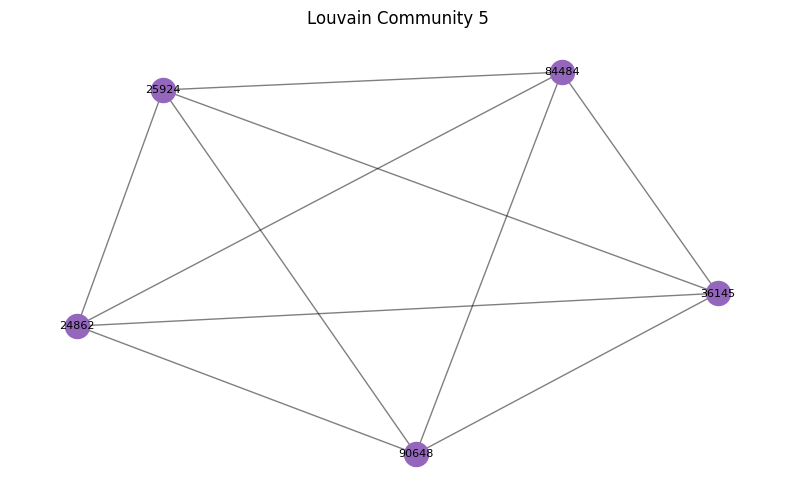

Community 6: frozenset({65406, 8295})


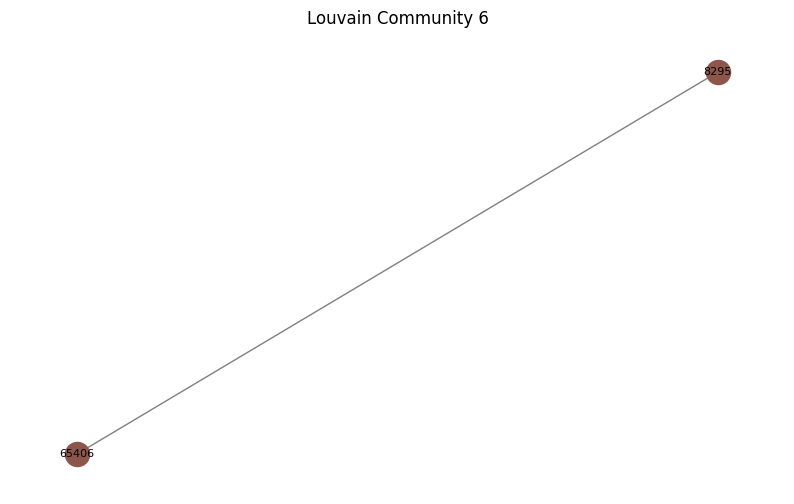

Community 7: frozenset({92674, 45629})


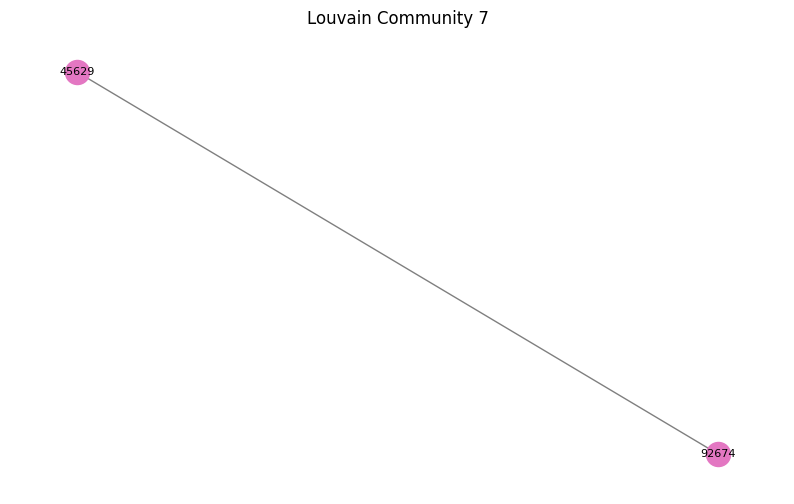

Community 8: frozenset({27147})


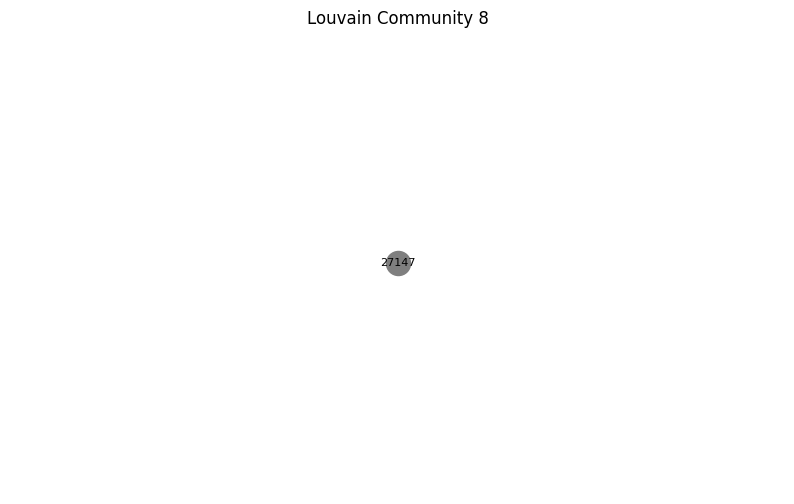

Community 9: frozenset({42478})


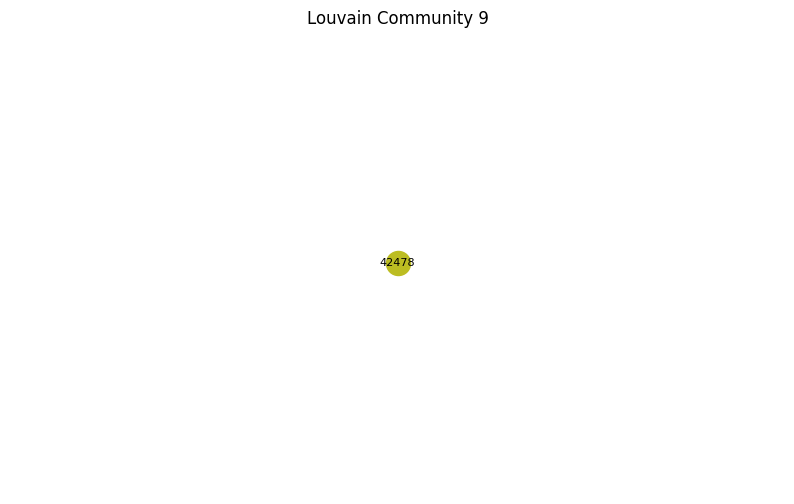

Community 10: frozenset({62179})


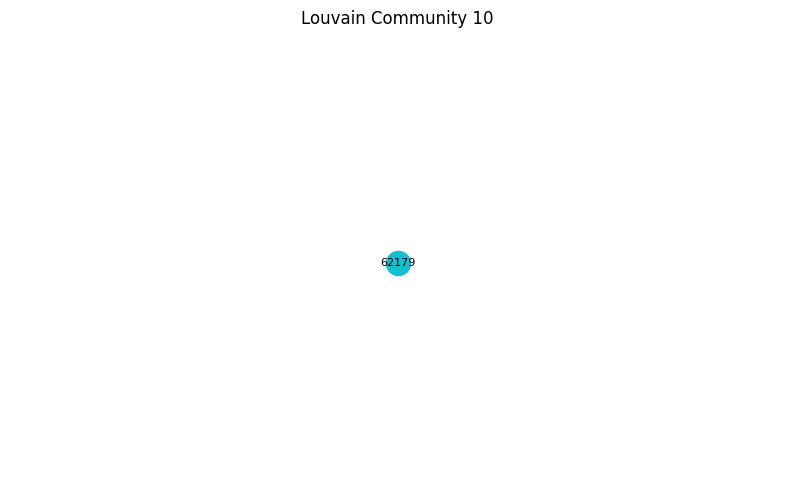

Community 11: frozenset({28903})


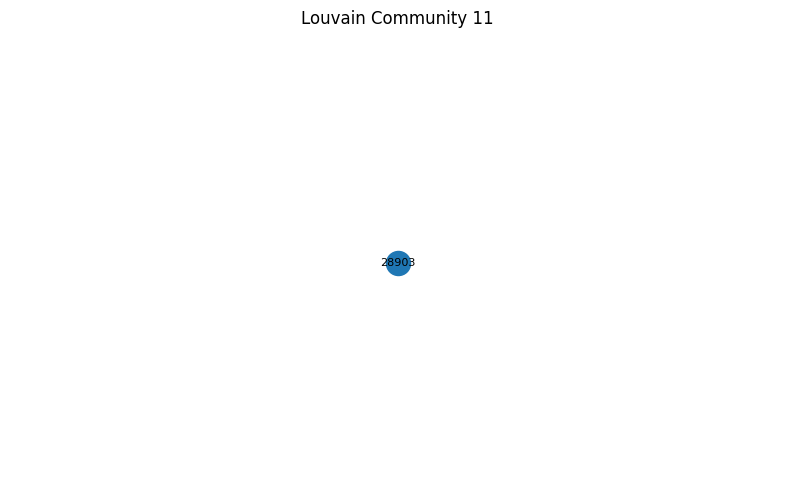

Community 12: frozenset({46640})


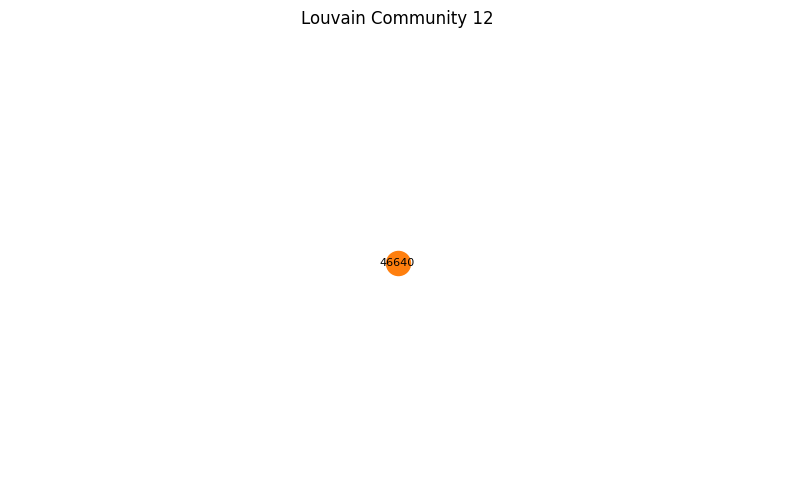

In [ ]:
start_time_louvain = time.time()

# run the Algorithm
louvain_communities = list(nx.algorithms.community.greedy_modularity_communities(G))

end_time_louvain = time.time()

# Print the number of communities detected
num_louvain_communities = len(louvain_communities)
print("Number of communities detected by Louvain Method:", num_louvain_communities)

# Calculate the modularity
modularity_louvain = nx.community.modularity(G, louvain_communities)
print("Modularity of Louvain Communities:", modularity_louvain)

# Calculate the execution time
louvain_time = end_time_louvain - start_time_louvain
print(f"Louvain algorithm - Execution time: {louvain_time:.4f} seconds")

for idx, community in enumerate(louvain_communities):
    # Print the set of nodes in each community
    print(f"Community {idx + 1}:", community)

    plt.figure(figsize=(10, 6))
    pos = nx.spring_layout(G.subgraph(community))

    # Draw nodes with different color for each community
    nx.draw_networkx_nodes(G.subgraph(community), pos, node_color=f'C{idx}', node_size=300)
    nx.draw_networkx_labels(G.subgraph(community), pos, font_size=8)

    nx.draw_networkx_edges(G.subgraph(community), pos, alpha=0.5)

    plt.title(f'Louvain Community {idx + 1}')
    plt.axis('off')
    plt.show()


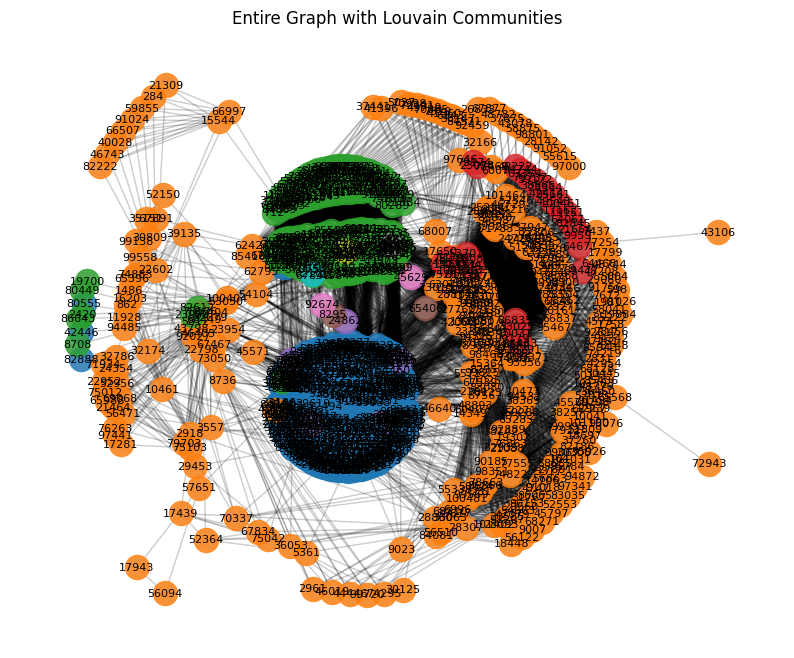

In [ ]:
plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(G)


nx.draw_networkx_nodes(G, pos, node_color='lightgray', node_size=200, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.2)
nx.draw_networkx_labels(G, pos, font_size=8)

louvain_communities = list(nx.algorithms.community.greedy_modularity_communities(G))

for idx, community in enumerate(louvain_communities):
    nx.draw_networkx_nodes(G, pos, nodelist=list(community), node_color=f'C{idx}', node_size=300, alpha=0.8)

plt.title("Entire Graph with Louvain Communities")
plt.axis('off')
plt.show()




```
# Girvan-Newman Community Detection
```




Number of communities detected by Girvan-Newman: 10
Sets of nodes for each community:
Community 1: [164, 231, 281, 340, 402, 492, 598, 712, 800, 802, 814, 862, 913, 919, 1137, 1156, 1244, 1338, 1480, 1486, 1758, 1890, 1979, 1981, 1991, 2051, 2164, 2420, 2608, 2831, 2853, 2918, 2961, 3001, 3122, 3123, 3195, 3317, 3548, 3557, 3597, 3616, 3984, 4316, 4573, 4575, 4747, 4873, 4926, 5004, 5027, 5255, 5339, 5361, 5563, 5661, 5812, 5849, 6007, 6143, 6390, 6392, 6528, 6628, 6996, 7026, 7045, 7193, 7217, 7319, 7329, 7338, 7406, 7437, 7672, 7731, 7849, 8179, 8190, 8300, 8311, 8532, 8617, 8708, 8736, 8756, 8803, 8853, 9007, 9023, 9029, 9035, 9066, 9339, 9431, 9521, 9634, 9657, 9808, 9959, 9974, 10031, 10041, 10136, 10144, 10174, 10461, 10473, 11025, 11254, 11286, 11303, 11366, 11578, 11792, 11837, 11840, 11928, 12175, 12228, 12239, 12314, 12744, 13630, 13788, 13797, 13961, 14349, 14394, 14706, 15058, 15116, 15190, 15232, 15271, 15364, 15495, 15633, 15772, 15971, 16146, 16203, 16291, 16339, 16441,

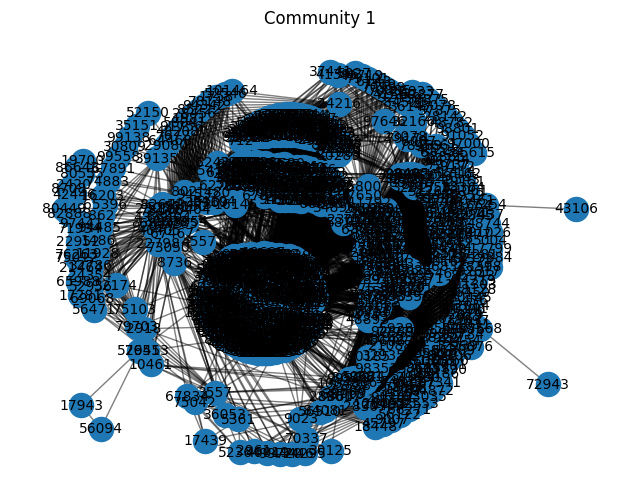

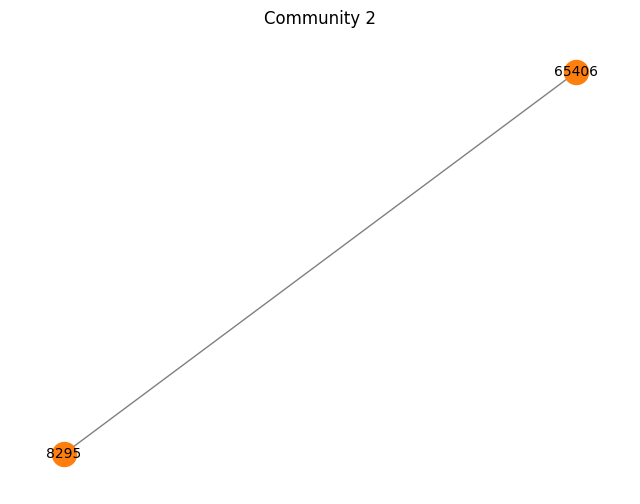

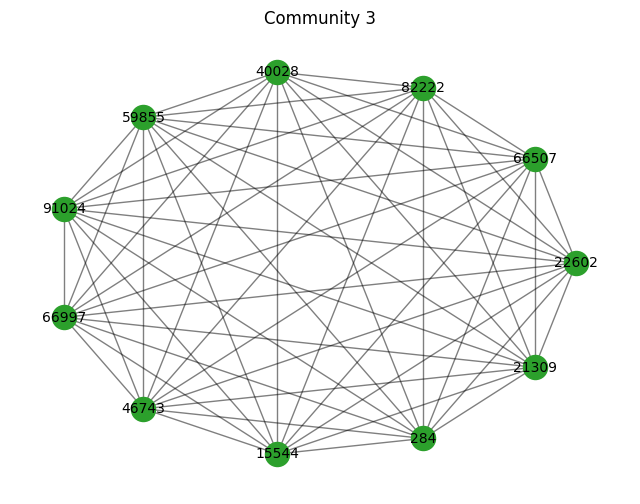

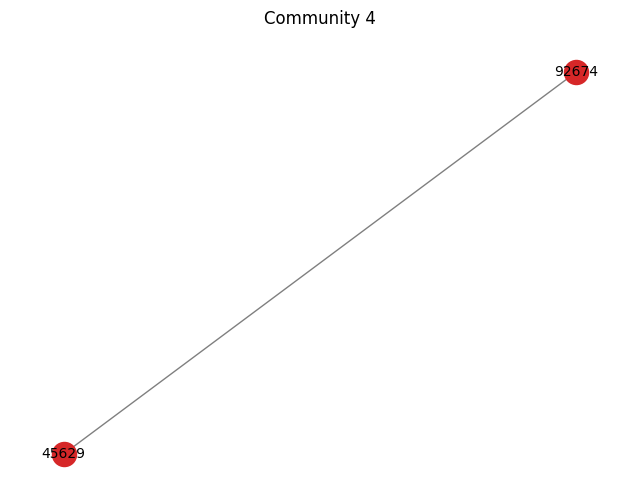

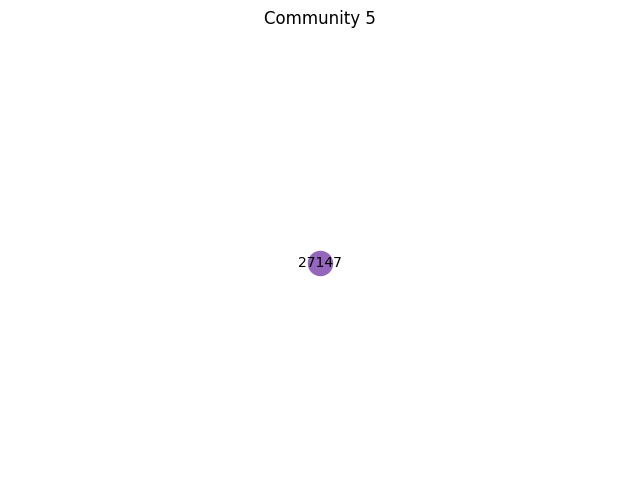

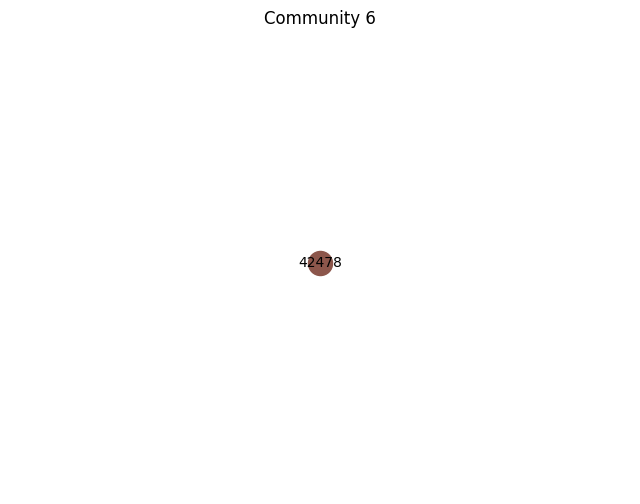

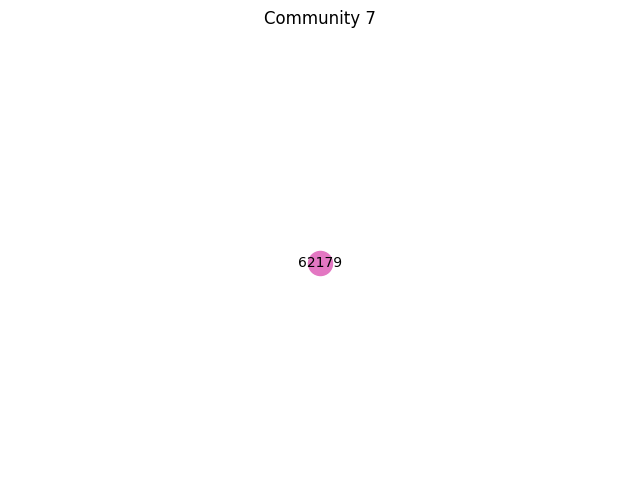

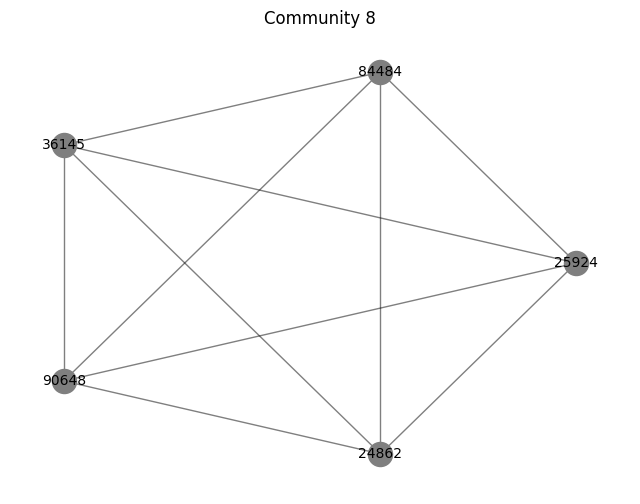

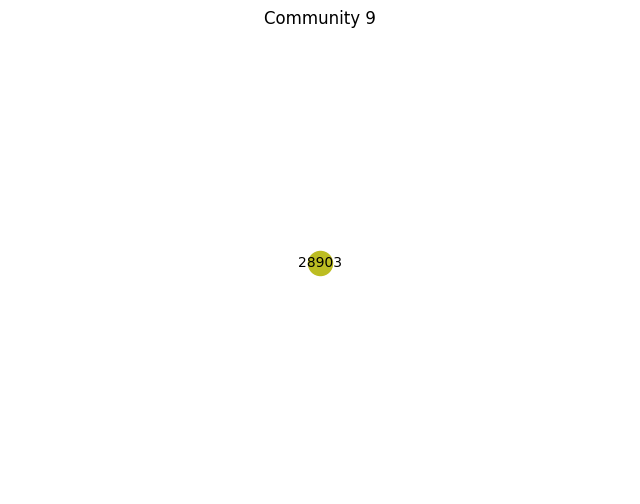

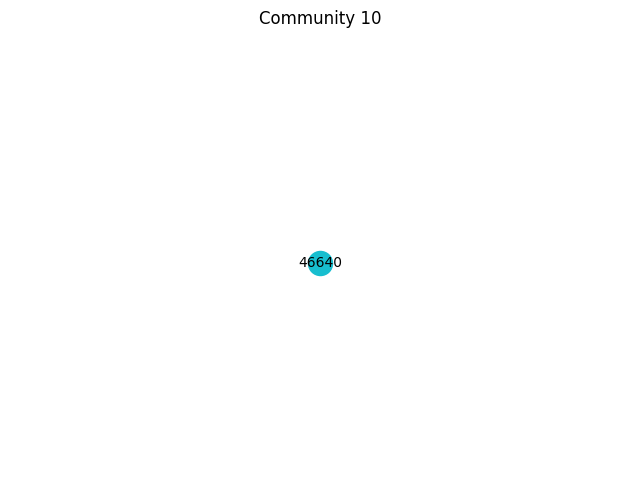

In [ ]:
start_time_girvan = time.time()

comp_gn = girvan_newman(G)

communities_gn = tuple(sorted(c) for c in next(comp_gn))

end_time_girvan = time.time()

num_communities = len(communities_gn)
print(f"\nNumber of communities detected by Girvan-Newman: {num_communities}")

# Print the set of nodes for each community in one line
print("Sets of nodes for each community:")
for idx, community in enumerate(communities_gn):
    print(f"Community {idx + 1}: {community}")

modularity_gn = nx.community.modularity(G, communities_gn)
print("Modularity of Girvan-Newman Communities:", modularity_gn)

girvan_time = end_time_girvan - start_time_girvan
print(f"Girvan-Newman algorithm - Execution time: {girvan_time:.4f} seconds")

# Visualization / printing of communities
for idx, community in enumerate(communities_gn):
    plt.figure(figsize=(8, 6))
    pos = nx.kamada_kawai_layout(G.subgraph(community))

    nx.draw_networkx_nodes(G.subgraph(community), pos, node_color=f'C{idx}', node_size=300)
    nx.draw_networkx_labels(G.subgraph(community), pos, font_size=10)
    nx.draw_networkx_edges(G.subgraph(community), pos, alpha=0.5)

    plt.title(f'Community {idx + 1}')
    plt.axis('off')
    plt.show()


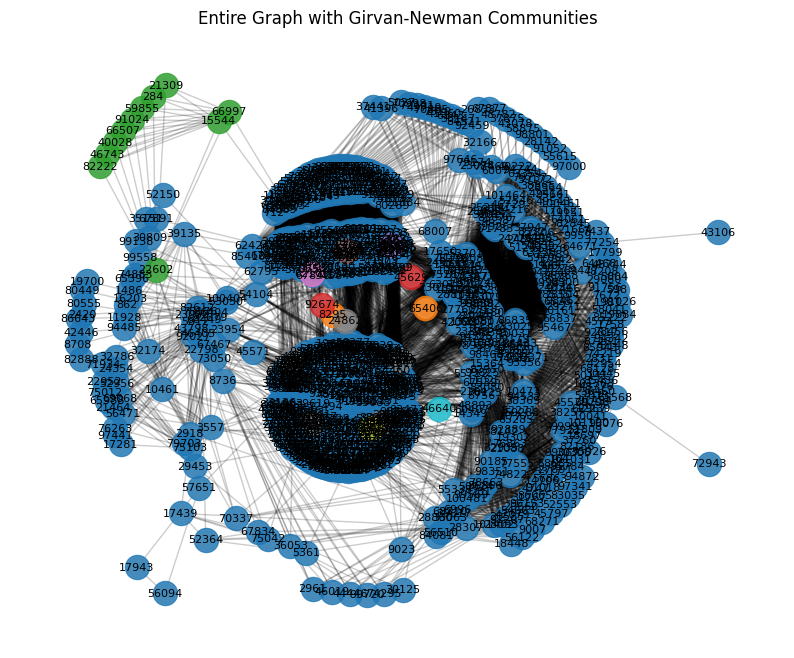

In [ ]:
plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(G)

# Draw nodes and edges for the entire graph with default color 'lightgray'
nx.draw_networkx_nodes(G, pos, node_color='lightgray', node_size=200, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.2)
nx.draw_networkx_labels(G, pos, font_size=8)

# Draw nodes for each community with distinct colors
for idx, community in enumerate(communities_gn):
    nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=f'C{idx}', node_size=300, alpha=0.8)

plt.title("Entire Graph with Girvan-Newman Communities")
plt.axis('off')
plt.show()

 Leading Eigenvector algorithm

Number of communities detected by Leading Eigenvector: 33
Execution time of Leading Eigenvector algorithm: 0.1555 seconds
Modularity of Leading Eigenvector Communities: 0.4233957352703041


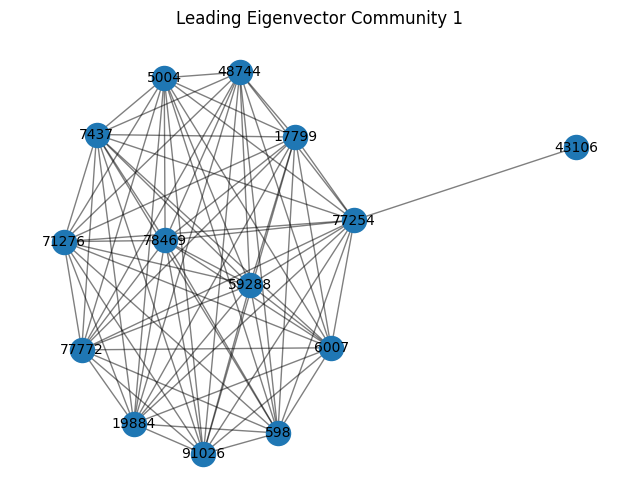

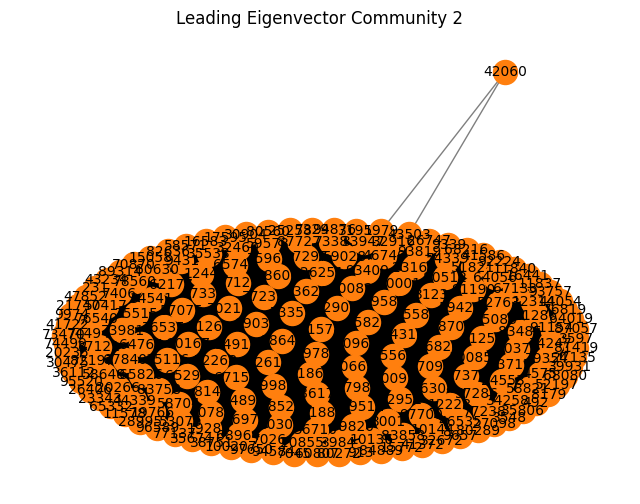

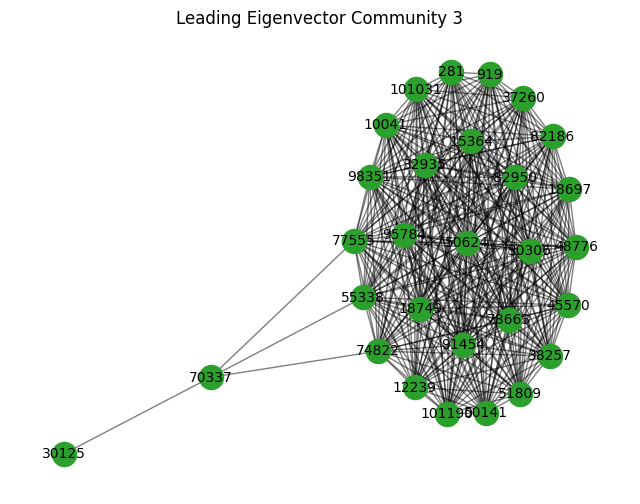

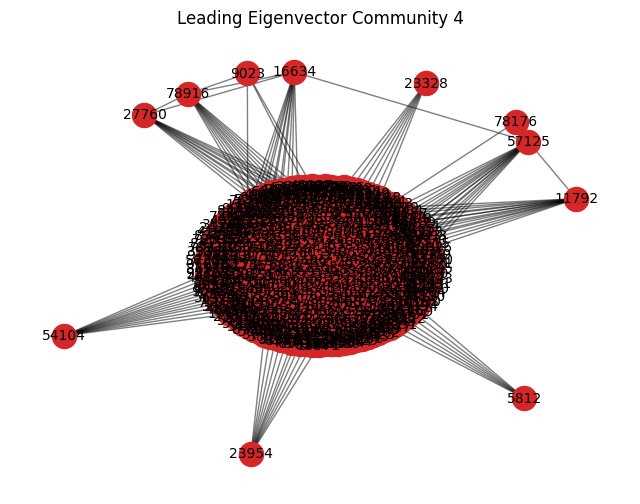

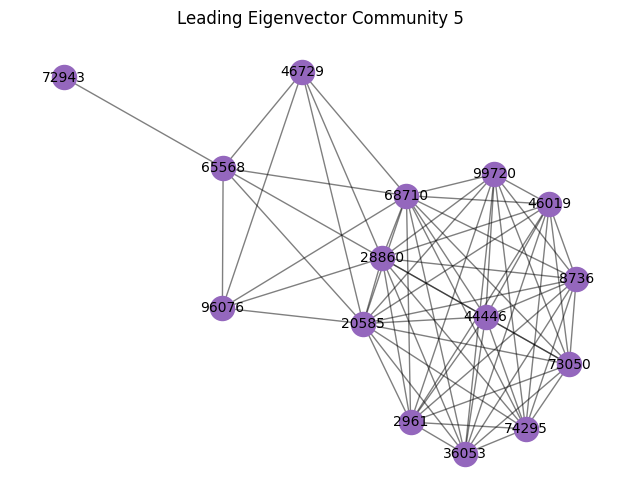

...

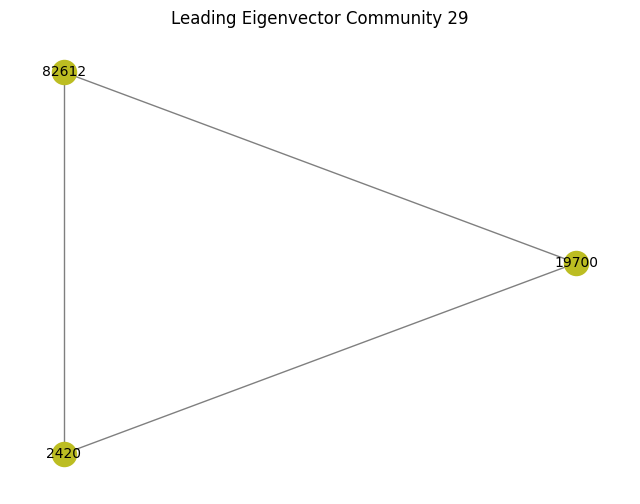

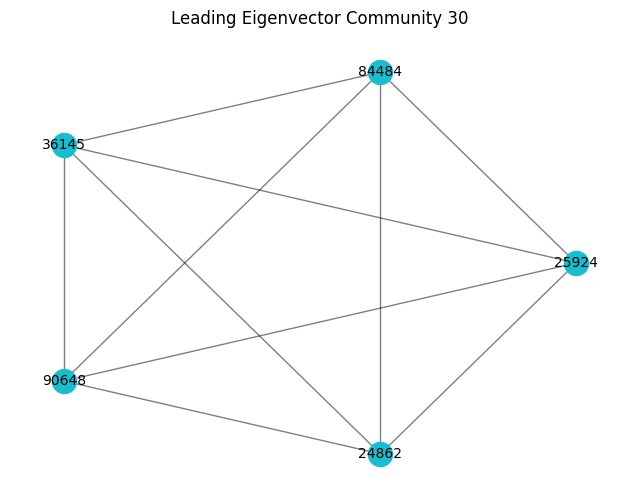

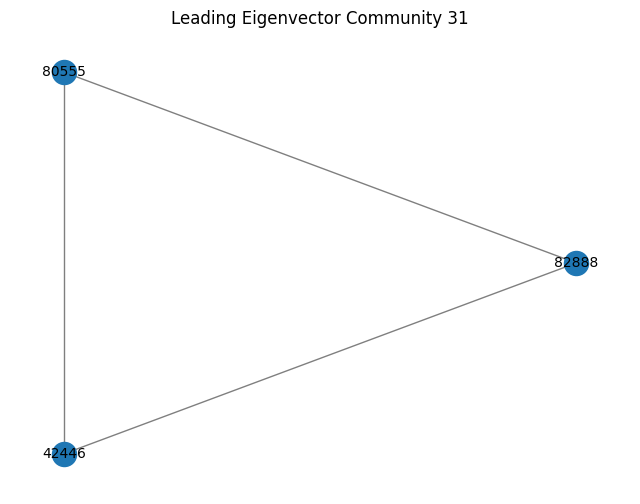

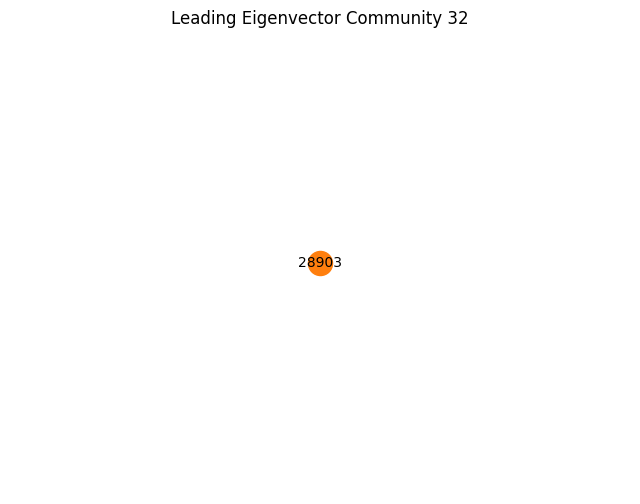

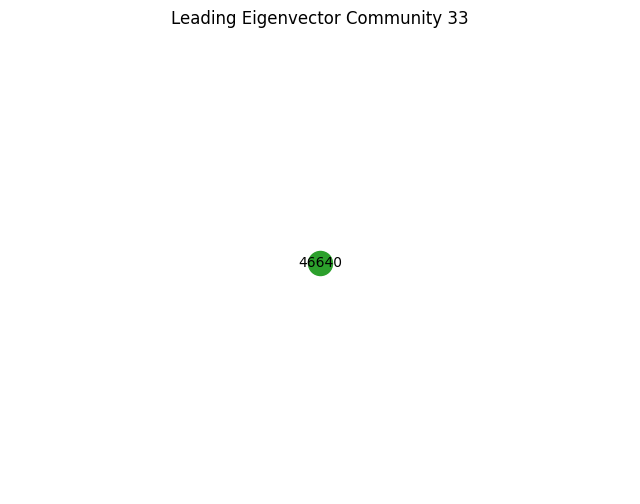

In [ ]:
start_time_leading_eigenvector = time.time()

communities_leading_eigenvector = list(nx.algorithms.community.asyn_lpa_communities(G))

end_time_leading_eigenvector = time.time()

# Print the number of communities
num_communities_leading_eigenvector = len(communities_leading_eigenvector)
print(f"Number of communities detected by Leading Eigenvector: {num_communities_leading_eigenvector}")

# here we print execution time
execution_time_leading_eigenvector = end_time_leading_eigenvector - start_time_leading_eigenvector
print(f"Execution time of Leading Eigenvector algorithm: {execution_time_leading_eigenvector:.4f} seconds")

#modularity
modularity_leading_eigenvector = nx.algorithms.community.modularity(G, communities_leading_eigenvector)
print(f"Modularity of Leading Eigenvector Communities: {modularity_leading_eigenvector}")

for idx, community in enumerate(communities_leading_eigenvector):
    plt.figure(figsize=(8, 6))
    pos = nx.kamada_kawai_layout(G.subgraph(list(community)))

    nx.draw_networkx_nodes(G.subgraph(list(community)), pos, node_color=f'C{idx}', node_size=300)
    nx.draw_networkx_labels(G.subgraph(list(community)), pos, font_size=10)
    nx.draw_networkx_edges(G.subgraph(list(community)), pos, alpha=0.5)

    plt.title(f'Leading Eigenvector Community {idx + 1}')
    plt.axis('off')
    plt.show()


In [ ]:

plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(G)

nx.draw_networkx_nodes(G, pos, node_color='lightgray', node_size=200, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.2)
nx.draw_networkx_labels(G, pos, font_size=8)

# Leading Eigenvector community detection
leading_eigenvector_communities = list(nx.algorithms.community.asyn_lpa_communities(G))

for idx, community in enumerate(leading_eigenvector_communities):
    nx.draw_networkx_nodes(G, pos, nodelist=list(community), node_color=f'C{idx}', node_size=300, alpha=0.8)

plt.title("Entire Graph with Leading Eigenvector Communities")
plt.axis('off')
plt.show()


#comparison

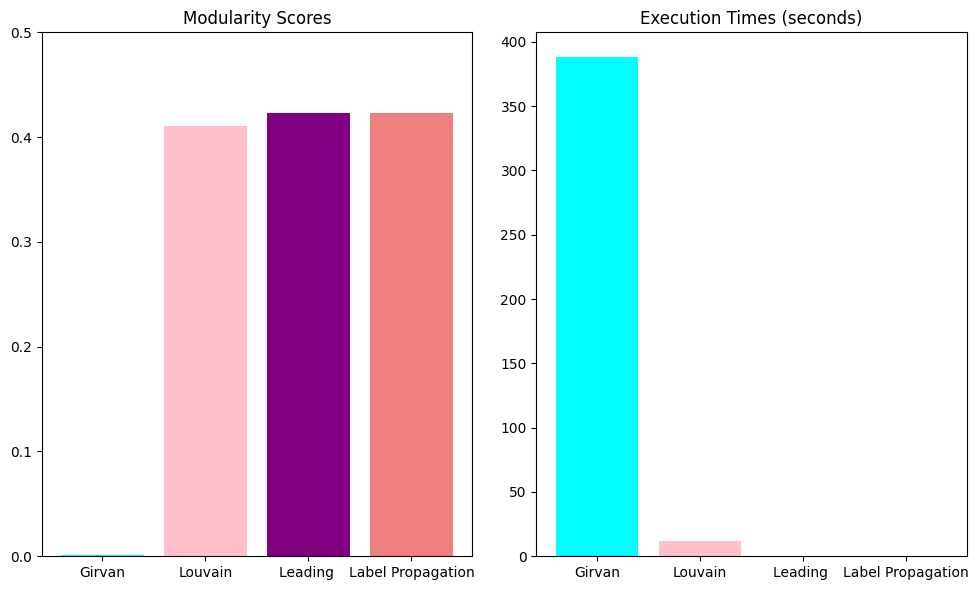

In [ ]:
# Modularity scores
modularity_scores = [modularity_gn, modularity_louvain, modularity_leading_eigenvector,modularity_lpa]

# Execution times in seconds
execution_times = [girvan_time, louvain_time, execution_time_leading_eigenvector,lpa_time]

# Algorithm names
algorithms = ['Girvan', 'Louvain', 'Leading ','Label Propagation'] #LPA : Label Propagation Algorithm

plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.bar(algorithms, modularity_scores, color=['cyan', 'pink', 'purple','lightcoral'])
plt.title('Modularity Scores')
plt.ylim(0, 0.5)

# Plot execution times
plt.subplot(1, 2, 2)
plt.bar(algorithms, execution_times, color=['cyan', 'pink', 'purple','lightcoral'])
plt.title('Execution Times (seconds)')

plt.tight_layout()
plt.show()


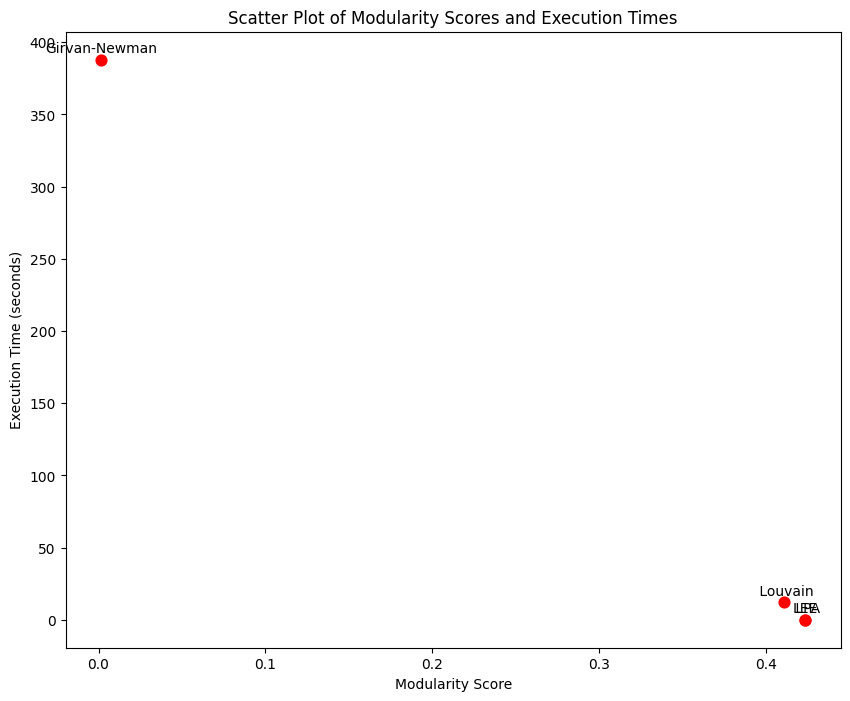

In [ ]:

algorithms = ['Girvan-Newman', ' Louvain', 'LEE',' LPA'] #LEE: leading_eigenvector ,LPA : Label Propagation Algorithm

plt.figure(figsize=(10, 8))
plt.scatter(modularity_scores, execution_times, c='r', marker='o', s=60)

for i, algorithm in enumerate(algorithms):
    plt.annotate(algorithm, (modularity_scores[i], execution_times[i]), textcoords="offset points", xytext=(0,5), ha='center')

# Labels and title
plt.xlabel('Modularity Score')
plt.ylabel('Execution Time (seconds)')
plt.title('Scatter Plot of Modularity Scores and Execution Times')

plt.show()